# Kaggle Project - Data Exploration and Cleaning

The purpose of this project is to explore and clean specific columns in the Kaggle train.csv dataset. In order to do this, I will explore, clean, as well as do univariate and bivariate explorations on the list of variables. At the end of my cleaning and analysis, I will write a conclusion highlighting the 7 variables found to have the strongest relationship with SalePrice. The dataset includes 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa. For the purpose of Dr. Young's class we will be analyzing 15 variables of her choice.

### Reading in the data sets, importing all libraries, and setting up 

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler

In [4]:
House_Sales = pd.read_csv('train.csv')

1. Displaying all the columns to see all columns including bath

In [4867]:
pd.set_option('display.max_columns', None)
House_Sales

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,

2. Making the Data Frame only include the variables we are analyzing for this project.

In [5]:
HS = House_Sales[['MSSubClass','LotFrontage','LotArea','LotShape','LotConfig','Neighborhood',
           'OverallQual','OverallCond','Exterior1st','1stFlrSF','2ndFlrSF','GarageQual',
           'GarageArea','SalePrice','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath',]]

###### number of rows

In [4869]:
len(HS.axes[0])

1460

###### Number of columns

In [4870]:
len(HS.axes[1])

18

### Analysis of all variables

I will start cleaning with SalePrice as it is the dependent variable that I will be using in my bivariate analysis.

#### 1. SalePrice 

###### Exploration:

1) First I will check the descriptive statistics, the boxplot to show outliers, and kdeplot to show skewing as SalePrice is a numeric variable.

In [4871]:
HS.agg(
        {
            'SalePrice':['min','mean', 'median','max','std'],
        }).round(2)

,SalePrice
min,34900.0
mean,180921.2
median,163000.0
max,755000.0
std,79442.5


<Axes: xlabel='SalePrice', ylabel='Density'>

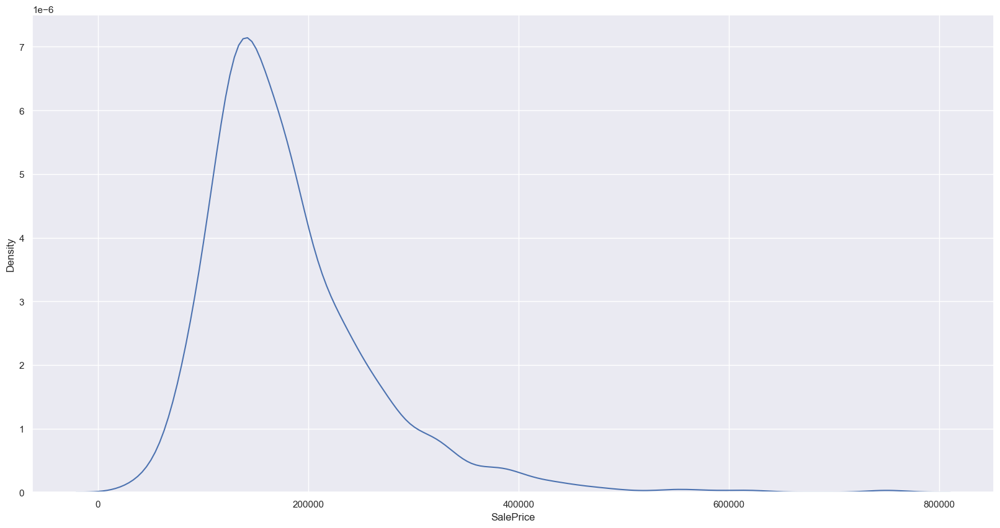

In [4872]:
sns.kdeplot(x='SalePrice', data = HS)

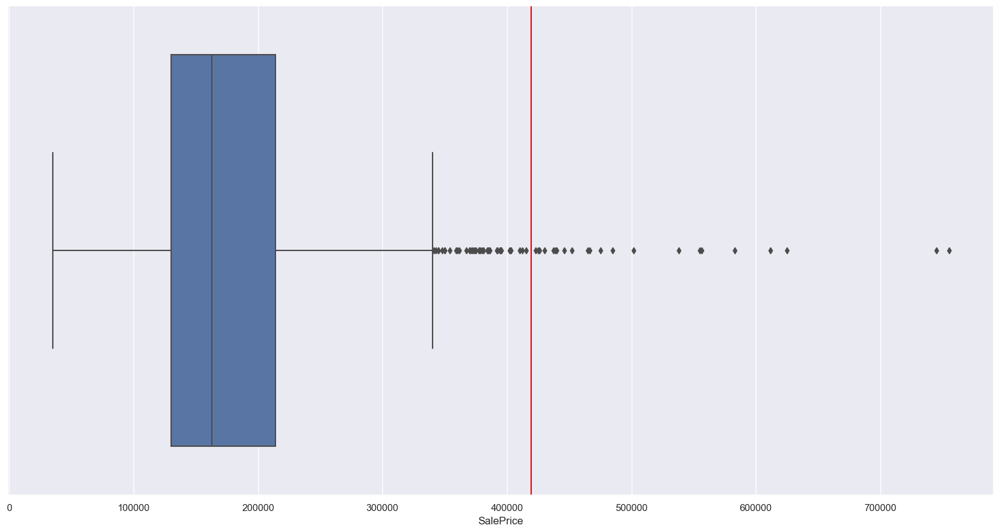

In [4873]:
x = sns.boxplot(x='SalePrice', data = HS)
x = x.axvline(SalePrice_mean + 3* SalePrice_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

There are outliers that need to be cleaned, and the data is skewed to the right.

###### Cleaning:

1. As we can see there are outliers that need to be cleaned. I will replace these with the mean + 3 standard deviations, this will be based off of the neighborhood that the outliers are in.

In [4874]:
HS.groupby("Neighborhood")["SalePrice"].agg(['mean', 'median','std']).round(0)

,mean,median,std
Neighborhood,,,
Blmngtn,194871.0,191000.0,30393.0
Blueste,137500.0,137500.0,19092.0
BrDale,104494.0,106000.0,14330.0
BrkSide,124834.0,124300.0,40349.0
ClearCr,212565.0,200250.0,50232.0
CollgCr,197966.0,197200.0,51404.0
Crawfor,210625.0,200624.0,68866.0
Edwards,128220.0,121750.0,43209.0
Gilbert,192855.0,181000.0,35987.0


In [4875]:
SalePrice_mean = HS['SalePrice'].mean()
SalePrice_std = HS['SalePrice'].std()

In [4876]:
((HS[HS['SalePrice'] > SalePrice_mean + 3* SalePrice_std]))

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath
58,60,66.0,13682,IR2,CulDSac,StoneBr,10,5,VinylSd,1426,1519,TA,641,438780,0,0,3,1
178,20,63.0,17423,IR1,CulDSac,StoneBr,9,5,VinylSd,2234,0,TA,1166,501837,1,0,2,0
185,75,90.0,22950,IR2,Inside,OldTown,10,9,Wd Sdng,1518,1518,Ex,840,475000,0,0,2,1
349,60,56.0,20431,IR2,Inside,NridgHt,9,5,CemntBd,1848,880,TA,706,437154,1,0,2,1
389,60,96.0,12474,Reg,Inside,NridgHt,10,5,VinylSd,1742,590,TA,846,426000,1,0,2,1
440,20,105.0,15431,Reg,Inside,NridgHt,10,5,VinylSd,2402,0,TA,672,555000,1,0,2,0
473,20,110.0,14977,IR1,Inside,NridgHt,8,5,VinylSd,1976,0,TA,908,440000,1,0,2,0
496,20,NaN,12692,IR1,Inside,NoRidge,8,5,BrkFace,3228,0,TA,546,430000,1,0,3,0
527,60,67.0,14948,IR1,Inside,NridgHt,9,5,VinylSd,1476,1237,TA,858,446261,1,0,2,1
591,60,97.0,13478,IR1,Corner,NridgHt,10,5,CemntBd,1728,568,TA,842,451950,1,0,2,1


In [4877]:
len((HS[HS['SalePrice'] > SalePrice_mean + 3* SalePrice_std]))

22

###### Cleaning with each outliers grouped mean based on what neighborhood the house is in:

This will be the same process of outlier cleaning for all of numeric variables that I will describe now: I will pull the mean and standard deviation for the variable by the neighborhood that they are in, in this case SalePrice. I will then do the same for the standard deviation. Once I have those defined, I will make a replacement variable for the outliers that is the neighborhood's mean + 3*standard deviation as a replacement for the outliers. This keeps the variability while also ensuring the variability is not too much. Once I have that replacement variable, I will use it to replace all values that are considered outliers based on the neighborhood that they are in.

1. StoneBr:

In [4878]:
StoneBr_SalePrice_mean = HS[(HS.Neighborhood == "StoneBr") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
StoneBr_SalePrice_mean

272727.4761904762

In [4879]:
StoneBr_SalePrice_std = HS[(HS.Neighborhood == "StoneBr") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
StoneBr_SalePrice_std

74482.14517830368

In [4880]:
Replacement_SP_StoneBr = StoneBr_SalePrice_std + 3 * StoneBr_SalePrice_std

In [4881]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "StoneBr"), "SalePrice"] = Replacement_SP_StoneBr 

2. NridgHt: 

In [4882]:
NridgHt_SalePrice_mean = HS[(HS.Neighborhood == "NridgHt") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
NridgHt_SalePrice_mean

290326.6119402985

In [4883]:
NridgHt_SalePrice_std = HS[(HS.Neighborhood == "NridgHt") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
NridgHt_SalePrice_std

69396.339137781

In [4884]:
Replacement_SP_NridgHt = NridgHt_SalePrice_mean + 3* NridgHt_SalePrice_std

In [4885]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "NridgHt"), "SalePrice"] = Replacement_SP_NridgHt 

3. OldTown:

In [4886]:
OldTown_SalePrice_mean = HS[(HS.Neighborhood == "OldTown") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
OldTown_SalePrice_mean

125129.09821428571

In [4887]:
OldTown_SalePrice_std = HS[(HS.Neighborhood == "OldTown") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
OldTown_SalePrice_std

41279.864558222835

In [4888]:
Replacement_SP_OldTown = OldTown_SalePrice_mean + 3 * OldTown_SalePrice_std

In [4889]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "OldTown"), "SalePrice"] = Replacement_SP_OldTown 

4. NoRidge: 

In [4890]:
NoRidge_SalePrice_mean = HS[(HS.Neighborhood == "NoRidge") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
NoRidge_SalePrice_mean

297933.55555555556

In [4891]:
NoRidge_SalePrice_std = HS[(HS.Neighborhood == "NoRidge") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
NoRidge_SalePrice_std

49357.73376624662

In [4892]:
SalePrice_mean + 3* SalePrice_std

419248.70453907084

In [4893]:
Replacement_SP_NoRidge = NoRidge_SalePrice_mean + 3 * NoRidge_SalePrice_std
Replacement_SP_NoRidge

446006.75685429544

In [4894]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "NoRidge"), "SalePrice"] = Replacement_SP_NoRidge 

5. Somerst:

In [4895]:
Somerst_SalePrice_mean = HS[(HS.Neighborhood == "Somerst") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
Somerst_SalePrice_mean

223054.89411764705

In [4896]:
Somerst_SalePrice_std = HS[(HS.Neighborhood == "Somerst") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
Somerst_SalePrice_std

52183.26535714197

In [4897]:
Replacement_SP_Somerst = Somerst_SalePrice_mean + 3 * Somerst_SalePrice_std

In [4898]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "Somerst"), "SalePrice"] = Replacement_SP_Somerst 

6. CollgCr:

In [4899]:
CollgCr_SalePrice_mean = HS[(HS.Neighborhood == "CollgCr") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].mean()
CollgCr_SalePrice_mean

196442.92617449665

In [4900]:
CollgCr_SalePrice_std = HS[(HS.Neighborhood == "CollgCr") &
                               (HS.SalePrice < SalePrice_mean + 3* SalePrice_std)]["SalePrice"].std()
CollgCr_SalePrice_std

48062.257839279424

In [4901]:
Replacement_SP_CollgCr = CollgCr_SalePrice_mean + 3 * CollgCr_SalePrice_std

In [4902]:
HS.loc[(HS.SalePrice > SalePrice_mean + 3* SalePrice_std) & 
       (HS.Neighborhood == "CollgCr"), "SalePrice"] = Replacement_SP_CollgCr 

###### Outliers delt with

2. Now that the outliers are cleaned, I will look for missing values

In [4903]:
HS[HS.SalePrice.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath


3. There are no null values, outliers have been cleaned, and all values look like they make sense to me. Now I will use boxcox to better have SalePrice follow a normal distribution.

In [4904]:
transformed_SalePrice, best_lambda = boxcox(HS.SalePrice)  
HS['SalePrice_Trans'] = transformed_SalePrice

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3106632213.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['SalePrice_Trans'] = transformed_SalePrice


4. Now that the data is cleaned and bests follows a normal distribution, I will save the standard deviation values (z-scores) for each individual value to help me in the future.

In [4905]:
scaler = StandardScaler()
HS["SalePrice_std"] = scaler.fit_transform(HS[['SalePrice_Trans']])
HS[["SalePrice_std", "SalePrice", "SalePrice_Trans"]].head(10)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/172386762.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["SalePrice_std"] = scaler.fit_transform(HS[['SalePrice_Trans']])


,SalePrice_std,SalePrice,SalePrice_Trans
0,0.578222,208500.0,11.844100
1,0.224997,181500.0,11.714406
2,0.755066,223500.0,11.909032
3,-0.436960,140000.0,11.471353
4,1.040149,250000.0,12.013707
5,-0.382863,143000.0,11.491216
6,1.562250,307000.0,12.205408
7,0.472241,200000.0,11.805186
8,-0.628057,129900.0,11.401188
9,-0.873381,118000.0,11.311111


###### Univariate Exploration:

1. I will begin by re-checking the descriptive statistics, KDE, and boxplot.

In [4906]:
HS.agg(
        {
            'SalePrice':['min','mean', 'median','max','std'],
        }).round(2)

,SalePrice
min,34900.00
mean,179616.80
median,163000.00
max,498515.63
std,74333.30


<Axes: xlabel='SalePrice', ylabel='Density'>

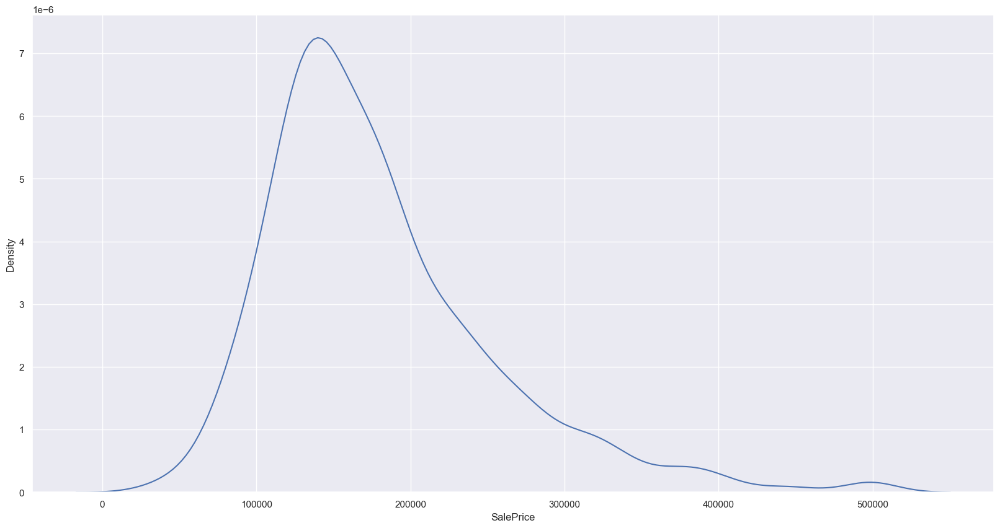

In [4907]:
sns.kdeplot(x='SalePrice', data = HS)

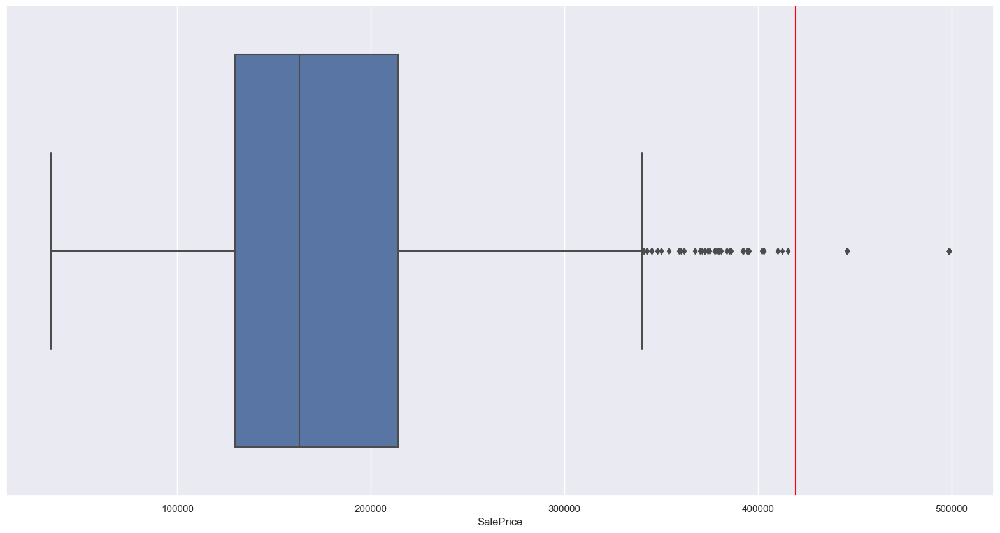

In [4908]:
x = sns.boxplot(x='SalePrice', data = HS)
x = x.axvline(SalePrice_mean + 3* SalePrice_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

We can see in general the distibution is approaching normality. It is much better than before we had cleaned it, however, it still has a slight right skew. With a mean value of 179,616 and a median of 163,000, I would feel more comfortable using the median as my measure of central tendency. The values that hold the highest z-scores are all towards the higher end rather than lower end of SalePrice. 

###### Bivariate Analysis for SalesPrice will be done throughout this notebook with each variable.

#### 2. MSSubClass

###### Exploration:

1) We check for proportions and countplot for categorical variable exploration.

In [4909]:
print(HS['MSSubClass'].value_counts())
HS['MSSubClass'].value_counts(normalize = True).round(2)

MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64


MSSubClass
20     0.37
60     0.20
50     0.10
120    0.06
30     0.05
160    0.04
70     0.04
80     0.04
90     0.04
190    0.02
85     0.01
75     0.01
45     0.01
180    0.01
40     0.00
Name: proportion, dtype: float64

<Axes: xlabel='MSSubClass', ylabel='count'>

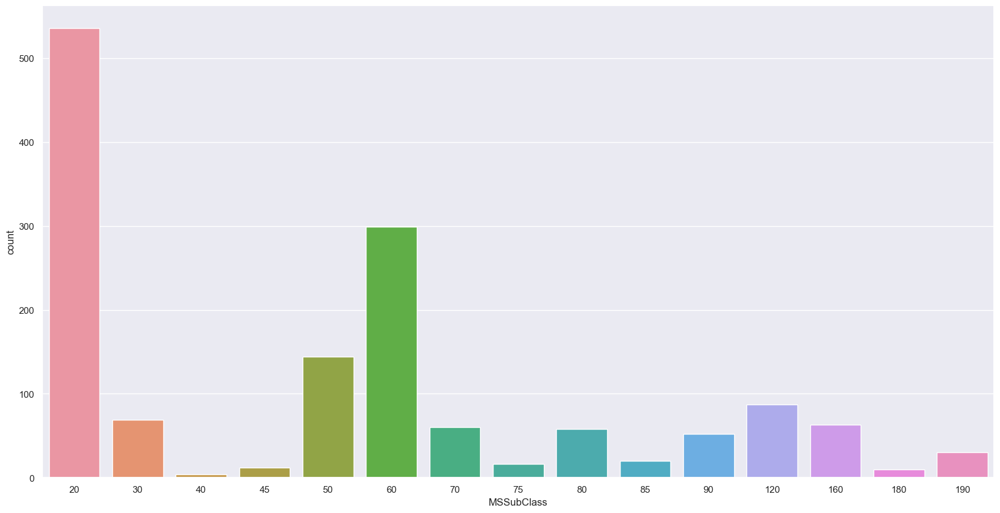

In [4910]:
sns.countplot(x='MSSubClass', data = HS)

There are underrepresnted values.

###### Cleaning:

1)
We can see the 40 MSSubClass is underrepresented as the value count is less than 10. Using the original House_Sales data set, I will check MSSubClass with the indetifier of 40 with building type and house style. Because the column MSSubClass uses numeric integer codes to represent the type of building the house is, it makes sense to put the 40 representation with one that is most similar to it based on these two variables.

In [4911]:
HS_MSSubClass = House_Sales.set_index("MSSubClass") #setting the index as MSSubClass

In [4912]:
pd.set_option('display.max_rows', None) #Displaying all rows so I can compare 40 to the rest off MSSubClass

In [4913]:
HS_MSSubClass.loc[ : , ["BldgType","HouseStyle"]] # Checking the 40 index against the two aforementioned variables

,BldgType,HouseStyle
MSSubClass,,
60,1Fam,2Story
20,1Fam,1Story
60,1Fam,2Story
70,1Fam,2Story
60,1Fam,2Story
50,1Fam,1.5Fin
20,1Fam,1Story
60,1Fam,2Story
50,1Fam,1.5Fin


2. To take a closer look I am looking at just values with 40 and 20 as I noticed it looks like all their values might be 1Fam and 1Story.

In [4914]:
print(House_Sales[House_Sales['MSSubClass'] == 40][['BldgType', 'HouseStyle']])
print(House_Sales[House_Sales['MSSubClass'] == 20][['BldgType', 'HouseStyle']])

     BldgType HouseStyle
164      1Fam     1Story
589      1Fam     1Story
873      1Fam     1Story
1270     1Fam     1Story
     BldgType HouseStyle
1        1Fam     1Story
6        1Fam     1Story
10       1Fam     1Story
12       1Fam     1Story
13       1Fam     1Story
14       1Fam     1Story
16       1Fam     1Story
18       1Fam     1Story
19       1Fam     1Story
22       1Fam     1Story
24       1Fam     1Story
25       1Fam     1Story
26       1Fam     1Story
27       1Fam     1Story
28       1Fam     1Story
31       1Fam     1Story
32       1Fam     1Story
33       1Fam     1Story
36       1Fam     1Story
37       1Fam     1Story
38       1Fam     1Story
40       1Fam     1Story
41       1Fam     1Story
43       1Fam     1Story
44       1Fam     1Story
47       1Fam     1Story
49       1Fam     1Story
53       1Fam     1Story
55       1Fam     1Story
59       1Fam     1Story
60       1Fam     1Story
66       1Fam     1Story
67       1Fam     1Story
70       1Fam     1Story


3) As the 4 values in the 40 index are all 1fam BldType and 1Story HouseStyle, which is the same for the 20 index (apart from 1), I will change all rows with the index 40 to now have the index 20

In [4915]:
HS.loc[HS.MSSubClass == 40, 'MSSubClass'] = 20

4. Checking for outliers

In [4916]:
HS[HS.MSSubClass.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std


Now the data is cleaned

##### Univariate Exploration:

1. Re-Checking the proportions and countplot for MSSubClass.

In [4917]:
print(HS['MSSubClass'].value_counts())
HS['MSSubClass'].value_counts(normalize = True).round(2)

MSSubClass
20     540
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
Name: count, dtype: int64


MSSubClass
20     0.37
60     0.20
50     0.10
120    0.06
30     0.05
160    0.04
70     0.04
80     0.04
90     0.04
190    0.02
85     0.01
75     0.01
45     0.01
180    0.01
Name: proportion, dtype: float64

<Axes: xlabel='MSSubClass', ylabel='count'>

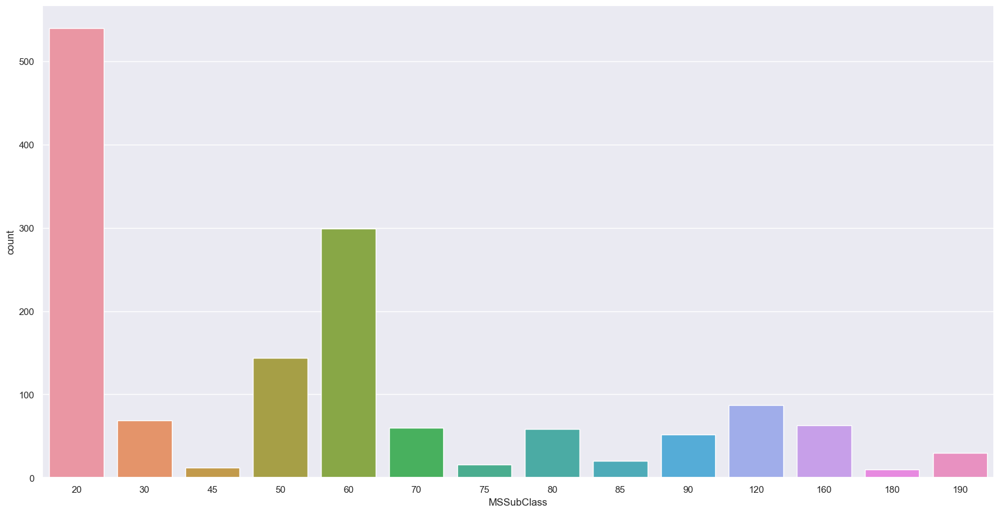

In [4918]:
sns.countplot(x='MSSubClass', data = HS)

For MSSubClass, the classes of 20, 60, and 50, represent the proportions 0.37, 0.20, and 0.10, respectively. This means these three classes represent 0.67 or 67% of the classes in the neighborhood, thus, an overwhelhming majority. The values 190, 85, 75, 45, and 180 all represent 2% or lower of the dataset, so while they are over the threshold to be underrepresented, it is rare for a house in this dataset to belong to those classes.

##### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='MSSubClass', ylabel='SalePrice'>

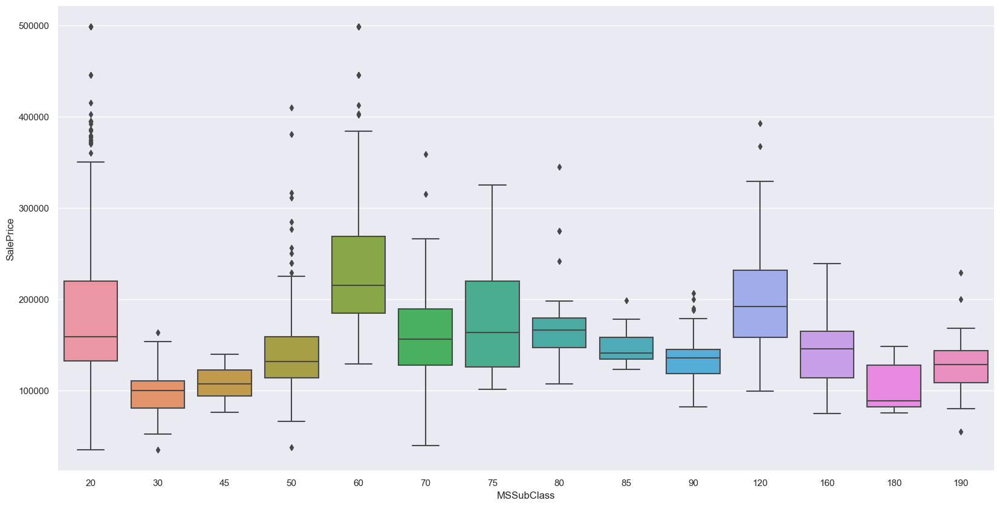

In [4919]:
sns.boxplot(x = 'MSSubClass', y = 'SalePrice', data = HS)

The median for MSSubClass 60 looks to be quite higher than the rest of the dataset. This shows there could be a positive correlation between this SubClass and SalePrice. This could be the same for 120 as well, as the median looks quite high as well in comparisons to the rest. Conversely, MSSubClas 30, 45, and 180 all look to have low medians and could be correlated with lower SalePrices. I will now check the correlations.

2. Finding the correlation between MSSubClass and SalePrice.

In [4920]:
HS_Cor = HS[['MSSubClass','SalePrice_Trans']] # Creating new dataframe just with the two variables

In [4921]:
HS_Cor.MSSubClass = HS_Cor.MSSubClass.astype(str) # One hot encoding MSSubClass

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3542289951.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS_Cor.MSSubClass = HS_Cor.MSSubClass.astype(str) # One hot encoding MSSubClass


In [4922]:
HS_Cor = pd.get_dummies(HS_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each MSSubClass.

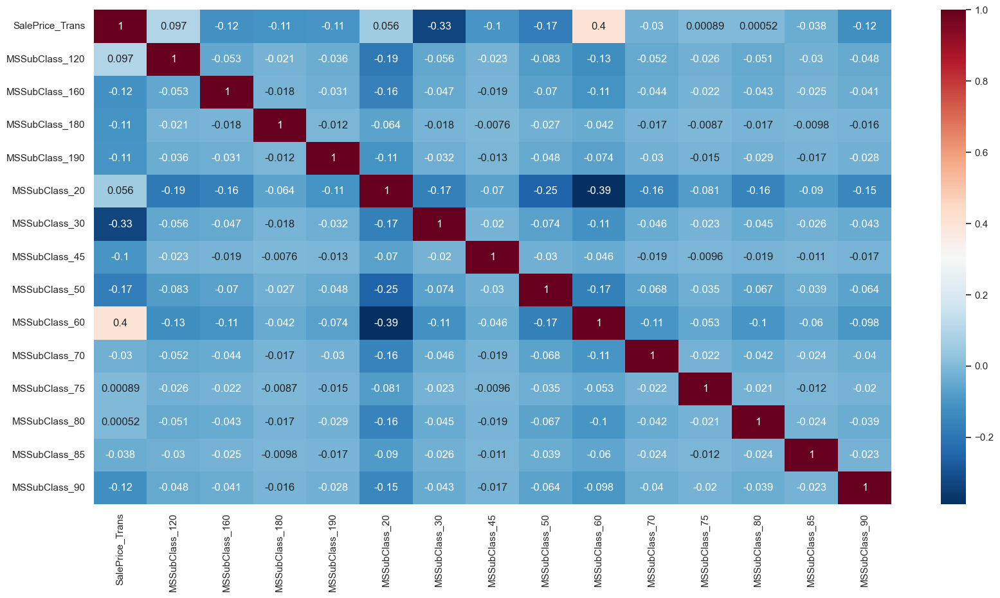

In [4923]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(HS_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show()  

There are correlations between Sale Price and certain MSSubClasses that are notable. For MSSubClass_60 we observe a correlation of 0.4, signifying a positive correlation between the two variables. For negative correlations, MSSubClass_160,30,50,and 90, have correlations of-0.12, -0.33, -0.17, and -0.12 respectively. Overall, it seems there is some solid correlations between MSSubClasses and SalePrice, the most notably being MSSubClass_60 with that positive correlation of 0.40.

#### LotFrontage

###### Exploration:

1) First I will check the descriptive statistics, the boxplot to show outliers, and kdeplot to show skewing as LotFrontage is a numeric variable.

In [4924]:
HS.agg(
        {
            'LotFrontage':['min','mean', 'median','max','std'],
        }).round(2)

,LotFrontage
min,21.00
mean,70.05
median,69.00
max,313.00
std,24.28


In [4925]:
LotFrontage_mean = HS['LotFrontage'].mean()
LotFrontage_std = HS['LotFrontage'].std()

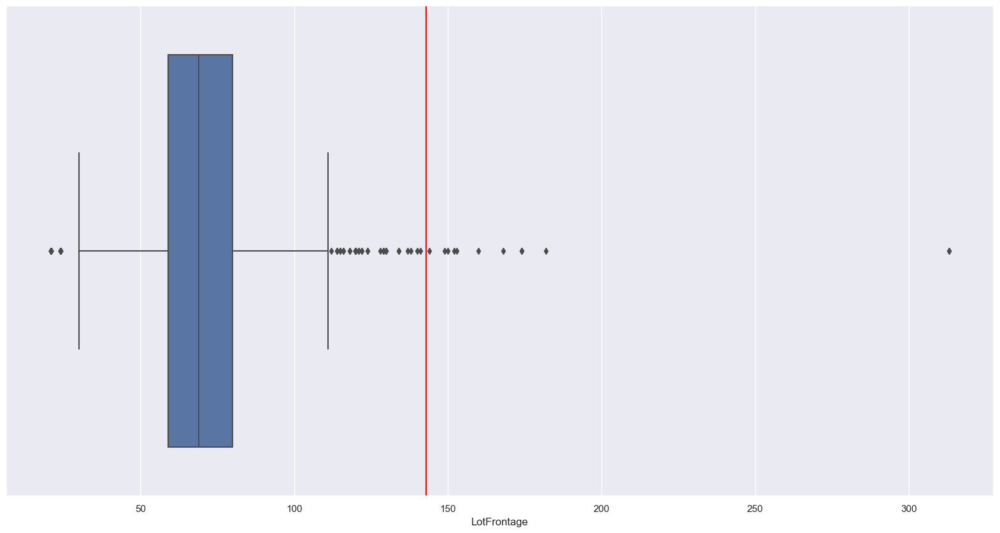

In [4926]:
x = sns.boxplot(x='LotFrontage', data = HS)
x = x.axvline(LotFrontage_mean + 3* LotFrontage_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

<Axes: xlabel='LotFrontage', ylabel='Density'>

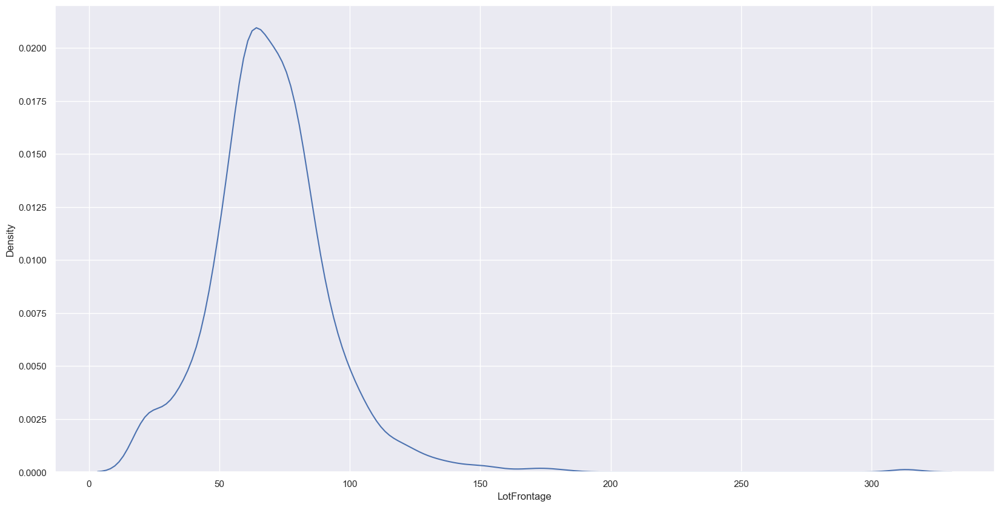

In [4927]:
sns.kdeplot(x='LotFrontage', data = HS)

###### Cleaning:

1) As we can see the KDE plot is skewed to the right, and with the standard deviation as high as it is in comparison to the mean, it looks like there are outliers that need to be cleaned. Especially the value at around ~ 300. I will now clean all outliers that are more than 3 standard deviations away by replacing those values with the mean + 3 standard deviations based on the neighborhood they are in.

In [4928]:
HS.groupby("Neighborhood")["LotFrontage"].agg(['mean', 'median','std']).round(0)

,mean,median,std
Neighborhood,,,
Blmngtn,47.0,43.0,5.0
Blueste,24.0,24.0,0.0
BrDale,22.0,21.0,1.0
BrkSide,58.0,52.0,16.0
ClearCr,83.0,80.0,19.0
CollgCr,72.0,70.0,16.0
Crawfor,72.0,74.0,19.0
Edwards,68.0,66.0,32.0
Gilbert,80.0,65.0,33.0


In [4929]:
(HS[HS['LotFrontage'] > LotFrontage_mean + 3* LotFrontage_std])

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std
197,75,174.0,25419,Reg,Corner,NAmes,8,4,Stucco,1360,1360,TA,795,235000.000000,1,1,2,0,11.955912,0.882744
231,60,174.0,15138,IR1,Inside,NoRidge,8,5,VinylSd,1490,1304,TA,810,403000.000000,1,0,2,1,12.459033,2.253002
313,20,150.0,215245,IR3,Inside,Timber,7,5,BrkFace,2036,0,TA,513,375000.000000,2,0,2,0,12.391946,2.070290
807,70,144.0,21384,Reg,Inside,BrkSide,5,6,Wd Sdng,1072,504,TA,528,223500.000000,2,0,1,1,11.909032,0.755066
909,60,149.0,12589,IR2,Inside,Gilbert,6,5,VinylSd,742,742,TA,390,174000.000000,0,0,2,1,11.674921,0.117460
934,20,313.0,27650,IR2,Inside,NAmes,7,7,Wd Sdng,2069,0,TA,505,242000.000000,1,0,2,0,11.983331,0.957420
1107,60,168.0,23257,IR3,CulDSac,Gilbert,7,5,VinylSd,887,1134,TA,422,274725.000000,0,0,2,1,12.101759,1.279961
1127,20,182.0,14572,IR3,Corner,Gilbert,7,5,VinylSd,1530,0,TA,630,259000.000000,1,0,2,0,12.046733,1.130096
1182,60,160.0,15623,IR1,Corner,NoRidge,10,5,Wd Sdng,2411,2065,TA,813,446006.756854,1,0,3,1,12.553452,2.510156
1211,50,152.0,12134,IR1,Inside,Gilbert,8,7,Wd Sdng,1080,672,TA,492,164000.000000,0,0,2,0,11.619525,-0.033411


###### Cleaning with each outliers grouped mean + 3std based on what neighborhood the house is in:

1. NAmes:

In [4930]:
NAmes_LotFrontage_mean = HS[(HS.Neighborhood == "NAmes") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
NAmes_LotFrontage_mean

74.64673913043478

In [4931]:
NAmes_LotFrontage_std = HS[(HS.Neighborhood == "NAmes") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
NAmes_LotFrontage_std

14.216137609899425

In [4932]:
Replacement_LF_NAmes = NAmes_LotFrontage_mean + 3 * NAmes_LotFrontage_std

In [4933]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "NAmes"), "LotFrontage"] = Replacement_LF_NAmes

2. NoRidge:

In [4934]:
NoRidge_LotFrontage_mean = HS[(HS.Neighborhood == "NoRidge") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
NoRidge_LotFrontage_mean

87.03225806451613

In [4935]:
NoRidge_LotFrontage_std = HS[(HS.Neighborhood == "NoRidge") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
NoRidge_LotFrontage_std

16.73615621136415

In [4936]:
Replacement_LF_NoRidge = NoRidge_LotFrontage_mean + 3 * NoRidge_LotFrontage_std

In [4937]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "NoRidge"), "LotFrontage"] = Replacement_LF_NoRidge 

3. Timber:

In [4938]:
Timber_LotFrontage_mean = HS[(HS.Neighborhood == "Timber") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
Timber_LotFrontage_mean

77.72413793103448

In [4939]:
Timber_LotFrontage_std = HS[(HS.Neighborhood == "Timber") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
Timber_LotFrontage_std

20.156347018325338

In [4940]:
Replacement_LF_Timber = Timber_LotFrontage_mean + 3 * Timber_LotFrontage_std

In [4941]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "Timber"), "LotFrontage"] = Replacement_LF_Timber 

4. BrkSide:

In [4942]:
BrkSide_LotFrontage_mean = HS[(HS.Neighborhood == "BrkSide") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
BrkSide_LotFrontage_mean

55.78

In [4943]:
BrkSide_LotFrontage_std = HS[(HS.Neighborhood == "BrkSide") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
BrkSide_LotFrontage_std

9.504649775080551

In [4944]:
Replacement_LF_BrkSide = BrkSide_LotFrontage_mean + 3 * BrkSide_LotFrontage_std

In [4945]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "BrkSide"), "LotFrontage"] = Replacement_LF_BrkSide 

5. Gilbert:

In [4946]:
Gilbert_LotFrontage_mean = HS[(HS.Neighborhood == "Gilbert") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
Gilbert_LotFrontage_mean

72.5111111111111

In [4947]:
Gilbert_LotFrontage_std = HS[(HS.Neighborhood == "Gilbert") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
Gilbert_LotFrontage_std

21.774278218099255

In [4948]:
Replacement_LF_Gilbert = Gilbert_LotFrontage_mean + 3 * Gilbert_LotFrontage_std

In [4949]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "Gilbert"), "LotFrontage"] = Replacement_LF_Gilbert

6. Edwards:

In [4950]:
Edwards_LotFrontage_mean = HS[(HS.Neighborhood == "Edwards") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
Edwards_LotFrontage_mean

65.52747252747253

In [4951]:
Edwards_LotFrontage_std = HS[(HS.Neighborhood == "Edwards") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
Edwards_LotFrontage_std

19.759296354622357

In [4952]:
Replacement_LF_Edwards = Edwards_LotFrontage_mean + 3 * Edwards_LotFrontage_std

In [4953]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "Edwards"), "LotFrontage"] = Replacement_LF_Edwards

7. Oldtown:

In [4954]:
OldTown_LotFrontage_mean = HS[(HS.Neighborhood == "OldTown") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].mean()
OldTown_LotFrontage_mean

61.9537037037037

In [4955]:
OldTown_LotFrontage_std = HS[(HS.Neighborhood == "OldTown") &
                               (HS.LotFrontage < LotFrontage_mean + 3* LotFrontage_std)]["LotFrontage"].std()
OldTown_LotFrontage_std

16.014820390366136

In [4956]:
Replacement_LF_OldTown = OldTown_LotFrontage_mean + 3 * OldTown_LotFrontage_std

In [4957]:
HS.loc[(HS.LotFrontage > LotFrontage_mean + 3* LotFrontage_std) & 
       (HS.Neighborhood == "OldTown"), "LotFrontage"] = Replacement_LF_OldTown

In [4958]:
(HS[HS['LotFrontage'] > LotFrontage_mean + 3* LotFrontage_std])

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std


###### All outliers are cleaned

2. The outliers have now been removed. Now, I will check for null values.

In [4959]:
HS[HS.LotFrontage.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std
7,60,NaN,10382,IR1,Corner,NWAmes,7,6,HdBoard,1107,983,TA,484,200000.000000,1,0,2,1,11.805186,0.472241
12,20,NaN,12968,IR2,Inside,Sawyer,5,6,HdBoard,912,0,TA,352,144000.000000,1,0,1,0,11.497744,-0.365084
14,20,NaN,10920,IR1,Corner,NAmes,6,5,MetalSd,1253,0,TA,352,157000.000000,1,0,1,1,11.578689,-0.144629
16,20,NaN,11241,IR1,CulDSac,NAmes,6,7,Wd Sdng,1004,0,TA,480,149000.000000,1,0,1,0,11.529714,-0.278012
24,20,NaN,8246,IR1,Inside,Sawyer,5,8,Plywood,1060,0,TA,270,154000.000000,1,0,1,0,11.560624,-0.193830
31,20,NaN,8544,IR1,CulDSac,Sawyer,5,6,HdBoard,1228,0,TA,271,149350.000000,0,0,1,1,11.531912,-0.272028
42,85,NaN,9180,IR1,CulDSac,SawyerW,5,7,HdBoard,884,0,TA,504,144000.000000,1,0,1,0,11.497744,-0.365084
43,20,NaN,9200,IR1,CulDSac,CollgCr,5,6,VinylSd,938,0,TA,308,130250.000000,1,0,1,0,11.403710,-0.621188
50,60,NaN,13869,IR2,Corner,Gilbert,6,6,VinylSd,794,676,TA,388,177000.000000,0,1,2,0,11.690916,0.161024
64,60,NaN,9375,Reg,Inside,CollgCr,7,5,VinylSd,1057,977,TA,645,219500.000000,1,0,2,1,11.892156,0.709103


3. Now that we see there are null values, I can use the lambda function to full those values in. I will fill this in with 0s as when it is a null value, it means that there is no lot frontage, hence the 0.

In [4960]:
HS['LotFrontage'] = HS['LotFrontage'].fillna(0)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1558784770.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['LotFrontage'] = HS['LotFrontage'].fillna(0)


In [4961]:
HS[HS.LotFrontage.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std


4. I will now use BoxCox to help it better follow a normal distribution. Because there are 0 values I add the small constant of 0.1 to allow boxcox to work.

In [4962]:
LotFrontage_Transformed, best_lambda = boxcox(HS['LotFrontage']+0.1) 

In [4963]:
HS['LotFrontage_Trans'] = LotFrontage_Transformed

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2632477166.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['LotFrontage_Trans'] = LotFrontage_Transformed


5. Now that the data is cleaned and bests follows a normal distribution, I will save the standard deviation values (z-scores) for each individual value to help me in the future.

In [4964]:
scaler = StandardScaler()
HS["LotFrontage_std"] = scaler.fit_transform(HS[['LotFrontage_Trans']])
HS[["LotFrontage_std", 'LotFrontage_Trans',"LotFrontage"]].head(10)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3532953474.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["LotFrontage_std"] = scaler.fit_transform(HS[['LotFrontage_Trans']])


,LotFrontage_std,LotFrontage_Trans,LotFrontage
0,0.347489,20.476157,65.0
1,0.672613,23.556956,80.0
2,0.414563,21.111730,68.0
3,0.233101,19.392237,60.0
4,0.755389,24.341327,84.0
5,0.775854,24.535249,85.0
6,0.566960,22.555812,75.0
7,-1.941601,-1.214784,0.0
8,0.017887,17.352912,51.0
9,-0.006860,17.118418,50.0


As we can see, now there are not outliers or null values for the lot frontage column. We can now begin analysis.

###### Univariate Exploration:

1) I will begin by re-checking the descriptive statistics, KDE, and boxplot.

In [4965]:
HS.agg(
        {
            'LotFrontage':['min','mean', 'median','max','std'],
        }).round(2)

,LotFrontage
min,0.00
mean,57.13
median,63.00
max,141.00
std,32.85


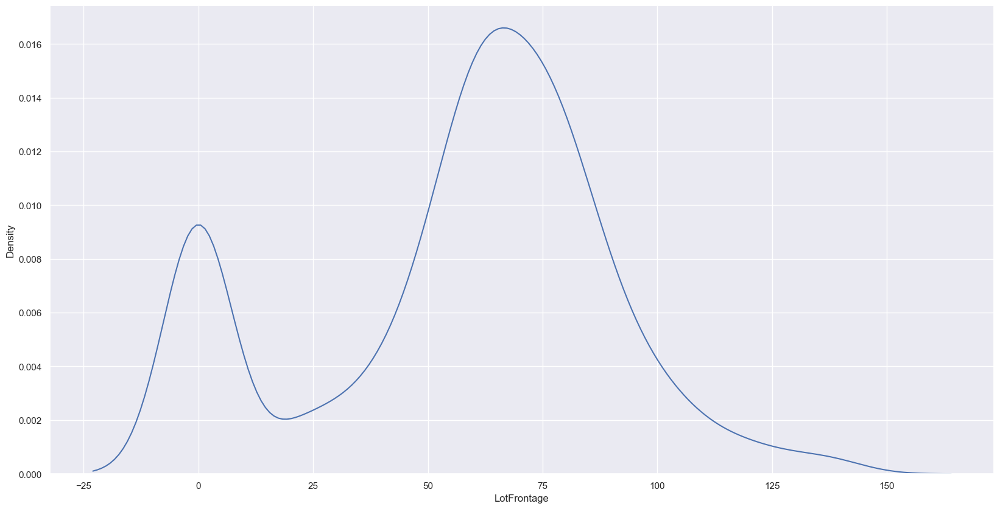

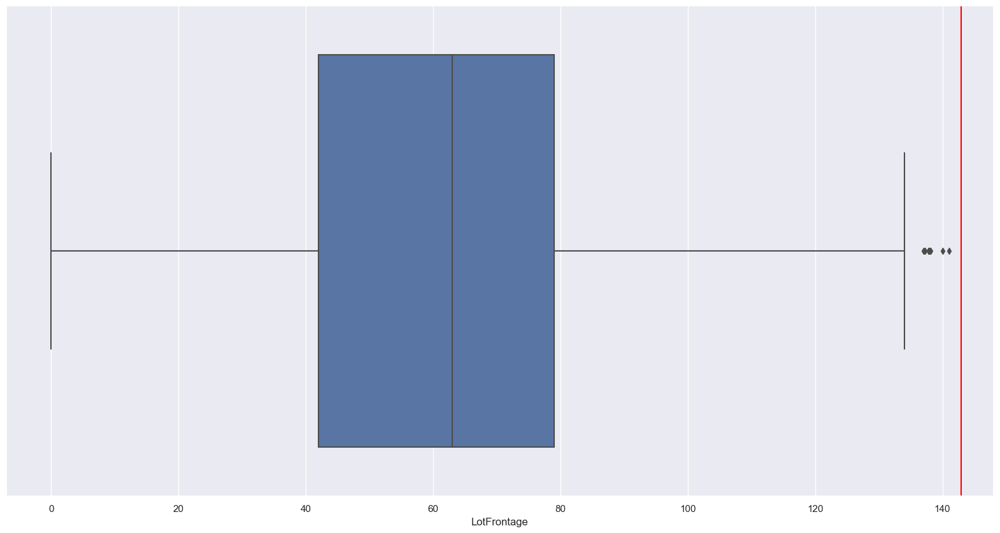

In [4966]:
sns.kdeplot(x = 'LotFrontage', data = HS)
plt.show()
x = sns.boxplot(x='LotFrontage', data = HS)
x = x.axvline(LotFrontage_mean + 3* LotFrontage_std, ymin = 0, ymax = 1, color = 'red')

plt.show()

First off, we now see that the data is cleaned and the data looks like it almost follows the normal distribution. The mean and median are close with the values 57.13 and 63.00 respectively which backs up that this is close to following a normal distribution. Obviously the cluster at 0 makes sense with all the houses that do not have any LotFrontage. It is more likely for there to be values outside the interquartile range on the higher end, as you can see a larger quantity outside of the whisker on the boxplot. This makes more sense as there can be values that are really big, but there can't be any that are below 0.

###### Bivariate Exploration:

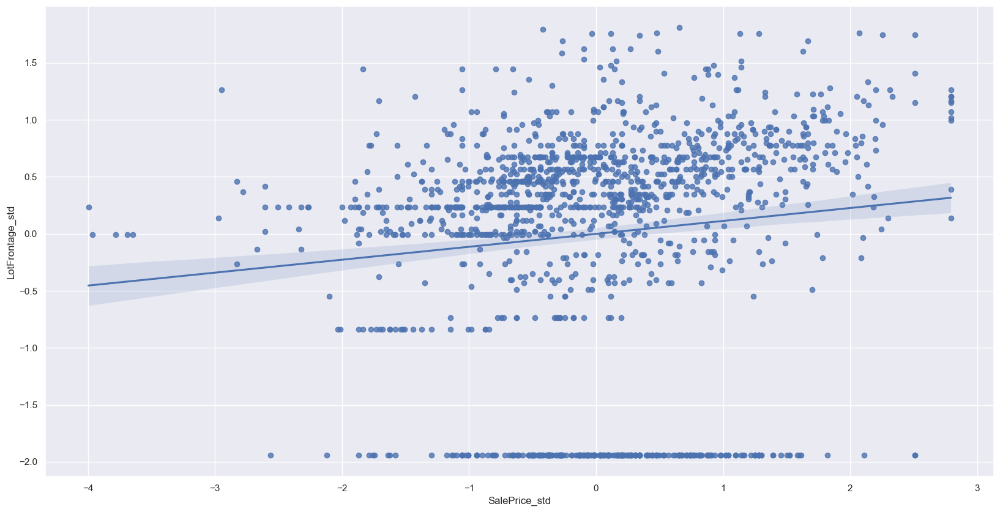

In [4967]:
sns.regplot(x= "SalePrice_std", y = "LotFrontage_std", data = HS)    
plt.show()           

In [4968]:
LotFrontage_Corr = HS[['LotFrontage_std','SalePrice_std']]

In [4969]:
LotFrontage_Corr.corr()

,LotFrontage_std,SalePrice_std
LotFrontage_std,1.000000,0.113428
SalePrice_std,0.113428,1.000000


There is a positive correlation between the two variables of ~ 0.11, which we can also visualize with the regression plot. Not the strongest correlation but we will see how it compares to the rest of the variables. I doubt this will be a top one.

#### LotShape

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration.

In [4970]:
print(HS['LotShape'].value_counts())
HS['LotShape'].value_counts(normalize = True).round(2)

LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64


LotShape
Reg    0.63
IR1    0.33
IR2    0.03
IR3    0.01
Name: proportion, dtype: float64

<Axes: xlabel='LotShape', ylabel='count'>

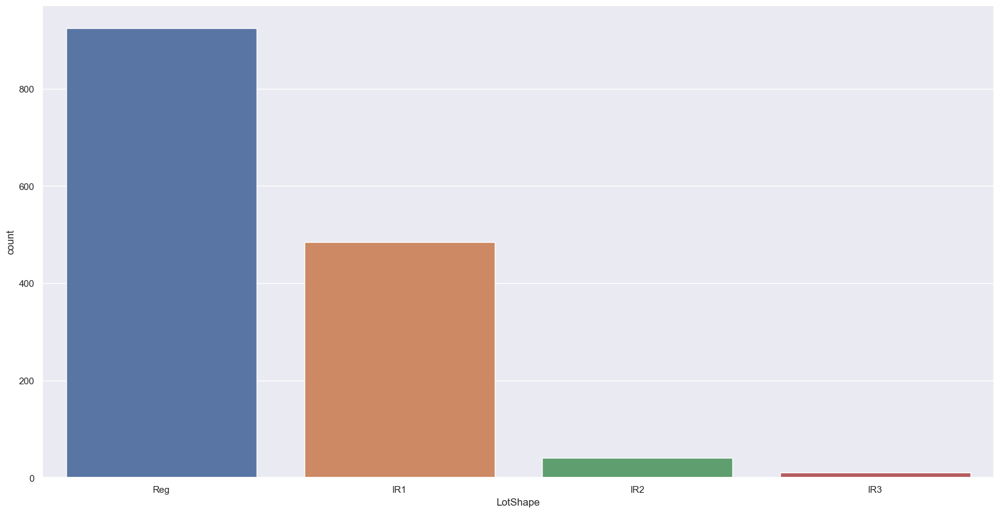

In [4971]:
sns.countplot(x='LotShape', data = HS)

There are no underrepresented values.

###### Cleaning:

In [4972]:
HS[HS.LotShape.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


Do not need to clean as there are no values that are underrepresented or null.

###### Univariate Exploration:

1. Checking the proportions and countplot for LotShape.

In [4973]:
print(HS['LotShape'].value_counts())
HS['LotShape'].value_counts(normalize = True).round(2)

LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64


LotShape
Reg    0.63
IR1    0.33
IR2    0.03
IR3    0.01
Name: proportion, dtype: float64

<Axes: xlabel='LotShape', ylabel='count'>

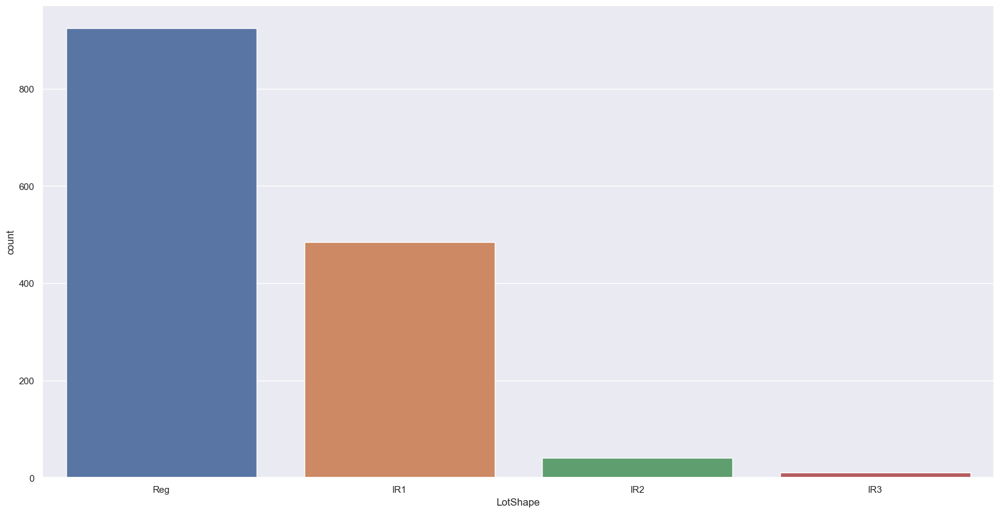

In [4974]:
sns.countplot(x='LotShape', data = HS)

For LotShape, the Reg lot shape makes up most of the houses in the data set with 63% belong to it. IR1 makes up a little over half of regs proportion at 0.33, while the other two IR types IR2 and IR3 are much more rare in the set, making up around 0.04 of the dataset combined.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='LotShape', ylabel='SalePrice'>

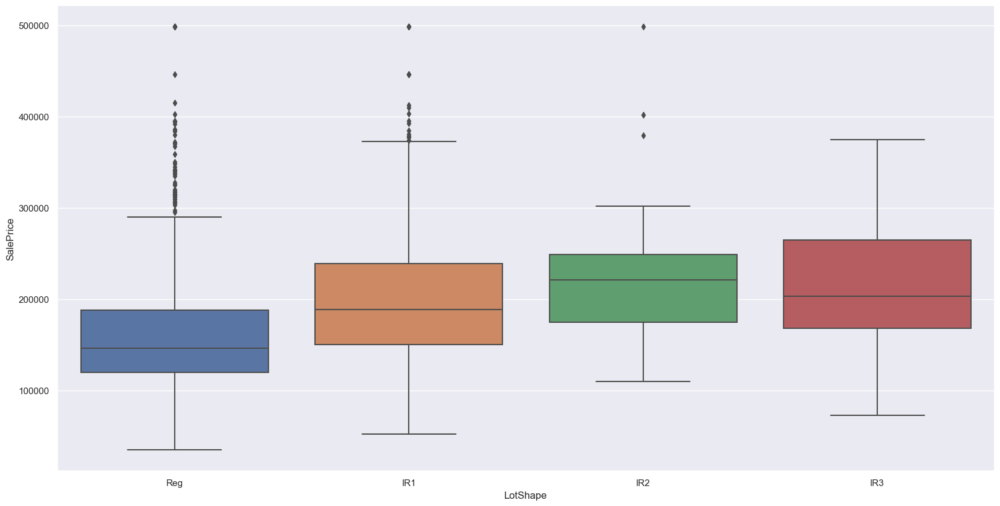

In [4975]:
sns.boxplot(x = 'LotShape', y = 'SalePrice', data = HS)

The median for the Reg LotShape is significantly lower than the rest of the LotShapes, so it might have a negative relationship with SalePrice. IR2 has a median value that is quite a bit higher than the rest. The difference in each lotshape's median makes me think these variables could be correlated. 

2. Finding the correlation between LotShape and SalePrice.

In [4976]:
LotShape_Cor = HS[['LotShape','SalePrice_std']] # Creating new dataframe just with the two variables

In [4977]:
LotShape_Cor.LotShape = LotShape_Cor.LotShape.astype(str) # One hot encoding LotShape

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2265289639.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LotShape_Cor.LotShape = LotShape_Cor.LotShape.astype(str) # One hot encoding LotShape


In [4978]:
LotShape_Cor = pd.get_dummies(LotShape_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each MSSubClass.

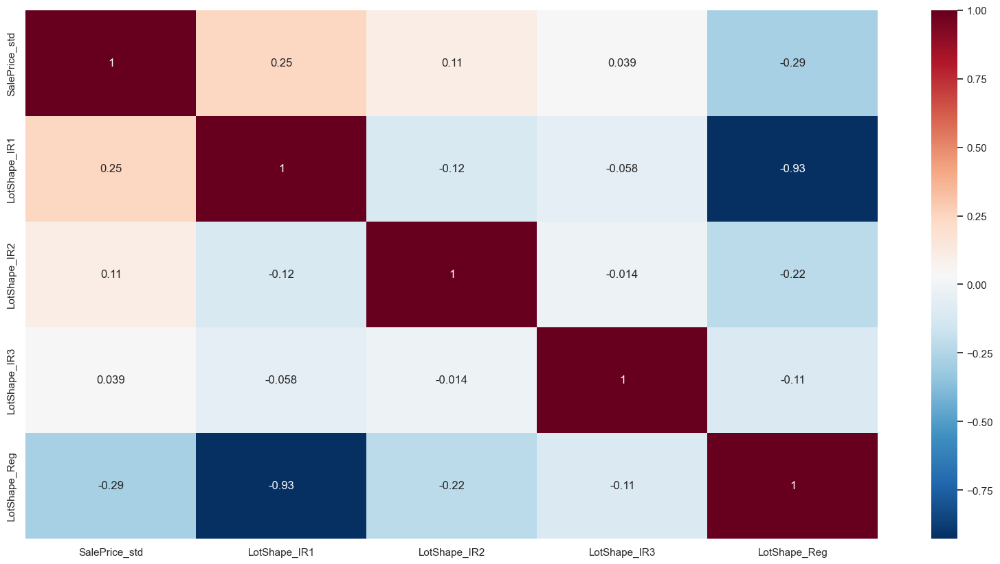

In [4979]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(LotShape_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show()  

There is a noticable positive correlation between SalePrice and LotShape_IR1 and IR2 with a correlation of 0.25 and 0.11 respectively. The LotShape_Reg on the other hand, has a negative correlation of -0.29. IR1 and Reg lotshapes have correlations to SalePrice that are good and we will likely use them as one of our top variables.

#### LotConfig

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration.

In [4980]:
print(HS['LotConfig'].value_counts())
HS['LotConfig'].value_counts(normalize = True).round(2)

LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64


LotConfig
Inside     0.72
Corner     0.18
CulDSac    0.06
FR2        0.03
FR3        0.00
Name: proportion, dtype: float64

<Axes: xlabel='LotConfig', ylabel='count'>

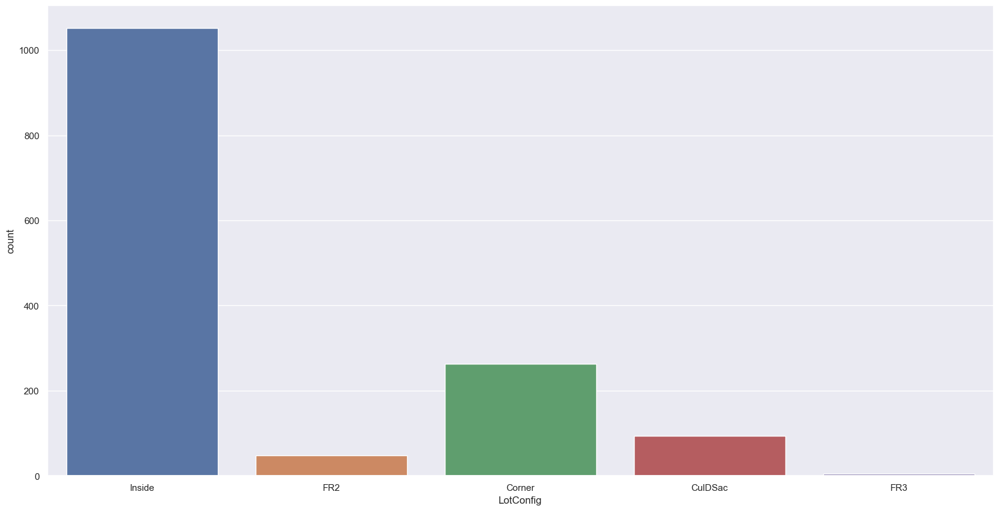

In [4981]:
sns.countplot(x='LotConfig', data = HS)

###### Cleaning:

1. We can see FR3 is an underepresented value count as it only has 4 counts. 

In [4982]:
print(House_Sales.groupby('LotConfig')[["SalePrice", "OverallQual"]].agg([np.mean, np.median]))

               SalePrice           OverallQual       
                    mean    median        mean median
LotConfig                                            
Corner     181623.425856  160000.0    6.076046    6.0
CulDSac    223854.617021  199262.0    6.500000    7.0
FR2        177934.574468  165000.0    6.191489    6.0
FR3        208475.000000  195450.0    7.250000    7.0
Inside     176938.047529  159697.5    6.060837    6.0


2. Because FR3 and the CulDSac both have similar medians and means for sale price, and the closest for overallQuall as well, I will put the FR3 values into the CulDSac ones.

In [4983]:
print(HS.groupby('LotConfig')[["SalePrice", "OverallQual"]].agg([np.mean, np.median]))
HS.loc[HS.LotConfig == 'FR3', 'LotConfig'] = 'CulDSac'
HS['LotConfig'].value_counts()

               SalePrice           OverallQual       
                    mean    median        mean median
LotConfig                                            
Corner     179488.745791  160000.0    6.076046    6.0
CulDSac    215267.172225  199262.0    6.500000    7.0
FR2        177934.574468  165000.0    6.191489    6.0
FR3        208475.000000  195450.0    7.250000    7.0
Inside     176428.755846  159697.5    6.060837    6.0


LotConfig
Inside     1052
Corner      263
CulDSac      98
FR2          47
Name: count, dtype: int64

3. Checking for Null values.

In [4984]:
HS[HS.LotConfig.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


3. We are done cleaning as there are no values that are underrepresented or null.

###### Univariate Exploration:

1. Re-checking the proportions and countplot for LotShape.

In [4985]:
print(HS['LotConfig'].value_counts())
HS['LotConfig'].value_counts(normalize = True).round(2)

LotConfig
Inside     1052
Corner      263
CulDSac      98
FR2          47
Name: count, dtype: int64


LotConfig
Inside     0.72
Corner     0.18
CulDSac    0.07
FR2        0.03
Name: proportion, dtype: float64

<Axes: xlabel='LotConfig', ylabel='count'>

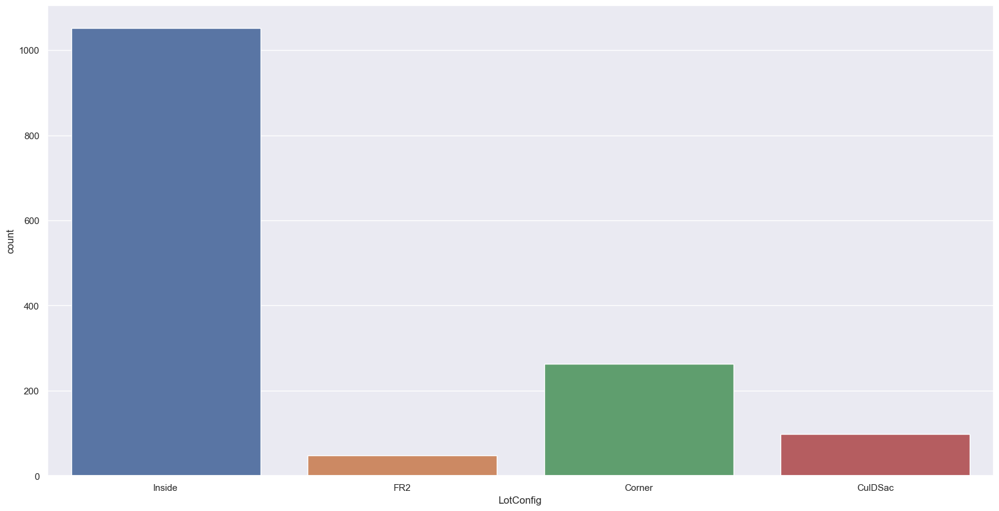

In [4986]:
sns.countplot(x='LotConfig', data = HS)

For LotConfig, the overwhelming amount of values belong to Inside, with 72% of the data set, while corner makes up the second most with 18%. CulDSac and FR2 are more rare LotConfig types in this data set making up a combined 10%. This makes sense for the CulDSac as we know it is a more rare type of LotConfig.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='LotConfig', ylabel='SalePrice'>

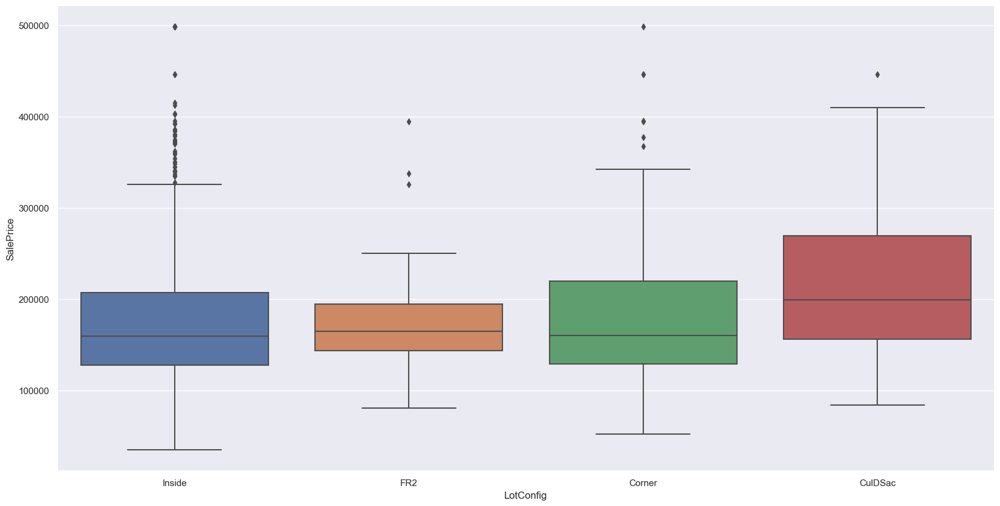

In [4987]:
sns.boxplot(x = 'LotConfig', y = 'SalePrice', data = HS)

This shows that CulDSac go for a higher SalePrice than the other types of LotConfig, which are all floating around approximetly the same medians. I would assume that SalePrice and CulDSac will be positively correlated. This might back up the popular notion that CulDSac houses sell for higher prices.

2. Finding the correlation between LotConfig and SalePrice.

In [4988]:
LotConfig_Cor = HS[['LotConfig','SalePrice_std']] # Creating new dataframe just with the two variables

In [4989]:
LotConfig_Cor.LotConfig = LotConfig_Cor.LotConfig.astype(str) # One hot encoding LotConfig

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1672570708.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LotConfig_Cor.LotConfig = LotConfig_Cor.LotConfig.astype(str) # One hot encoding LotConfig


In [4990]:
LotConfig_Cor = pd.get_dummies(LotConfig_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each LotConfig.

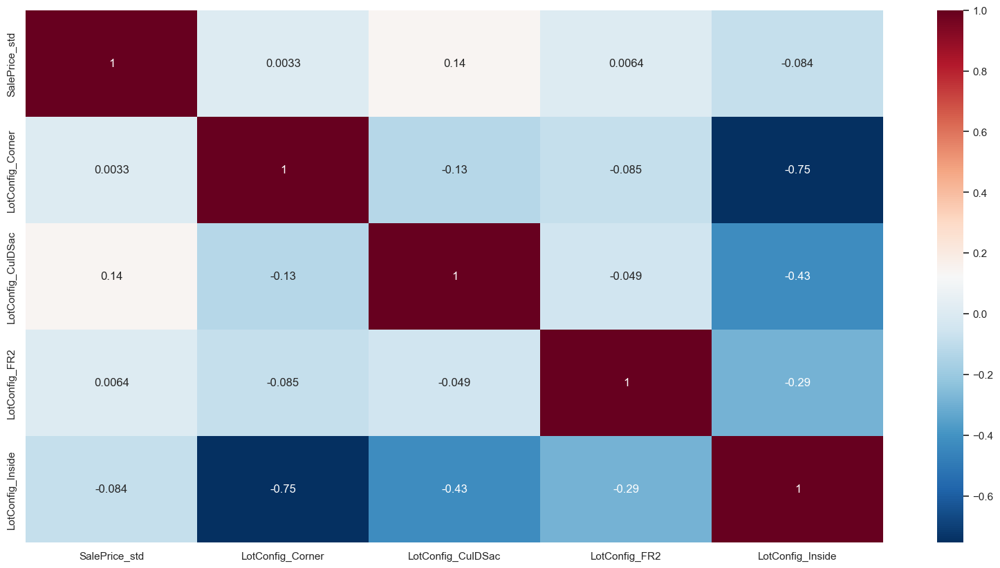

In [4991]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(LotConfig_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show()  

The only noticable correlation between SalePrice and all LotConfig is the CulDSac with a positive correlation of 0.14. All other correlations are not significant enough for us to care. This means I might use CulDSac as one of my top variables.

#### Neighborhood

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration.

In [4992]:
print(HS['Neighborhood'].value_counts())
HS['Neighborhood'].value_counts(normalize = True).round(2)

Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: count, dtype: int64


Neighborhood
NAmes      0.15
CollgCr    0.10
OldTown    0.08
Edwards    0.07
Somerst    0.06
Gilbert    0.05
NridgHt    0.05
Sawyer     0.05
NWAmes     0.05
SawyerW    0.04
BrkSide    0.04
Crawfor    0.03
Mitchel    0.03
NoRidge    0.03
Timber     0.03
IDOTRR     0.03
ClearCr    0.02
StoneBr    0.02
SWISU      0.02
MeadowV    0.01
Blmngtn    0.01
BrDale     0.01
Veenker    0.01
NPkVill    0.01
Blueste    0.00
Name: proportion, dtype: float64

<Axes: xlabel='Neighborhood', ylabel='count'>

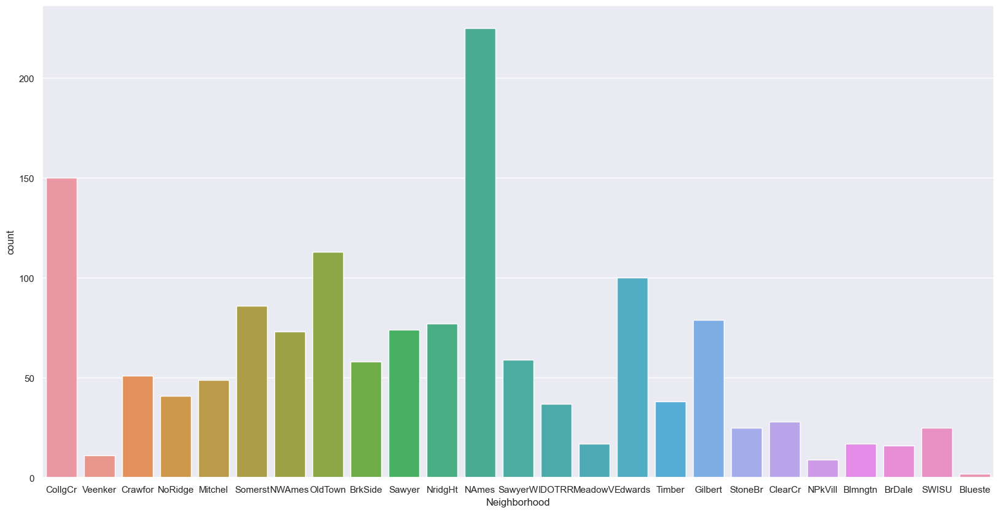

In [4993]:
sns.countplot(x='Neighborhood', data = HS)

###### Cleaning:

1. We can see NPkVill with 9 and Blueste with 2 values are underepresented value counts so we have to clean them. First I will check and see which out of three relvenant variables are they closest to in their measures of central tendenacies.

In [4994]:
HS.groupby('Neighborhood')[["SalePrice", "OverallQual",'LotArea']].agg([np.mean, np.median])

SalePrice           OverallQual              LotArea  \
                       mean    median        mean median          mean   
Neighborhood                                                             
Blmngtn       194870.882353  191000.0    7.176471    7.0   3398.176471   
Blueste       137500.000000  137500.0    6.000000    6.0   1625.000000   
BrDale        104493.750000  106000.0    5.687500    6.0   1801.000000   
BrkSide       124834.051724  124300.0    5.051724    5.0   7360.413793   
ClearCr       212565.428571  200250.0    5.892857    6.0  30875.750000   
CollgCr       197404.171331  197200.0    6.640000    7.0   9619.146667   
Crawfor       210624.725490  200624.0    6.274510    6.0  11809.686275   
Edwards       128219.700000  121750.0    5.080000    5.0  10218.650000   
Gilbert       192854.506329  181000.0    6.556962    7.0  11379.151899   
IDOTRR        100123.783784  103000.0    4.756757    5.0   8109.162162   
MeadowV        98576.470588   88000.0    4.470588    4.0   2324.000000   
Mitchel       156270.122449  153500.0    5.591837    5.0  11624.285714   
NAmes         145847.080000  140000.0    5.360000    5.0  10139.915556   
NPkVill       142694.444444  146000.0    6.000000    6.0   3267.444444   
NWAmes        189050.068493  182900.0    6.328767    6.0  11833.630137   
NoRidge       315991.263031  301500.0    7.926829    8.0  14218.902439   
NridgHt       317364.146669  315000.0    8.259740    8.0  10887.948052   
OldTown       126225.023822  119000.0    5.389381    5.0   8207.061947   
SWISU         142591.360000  139500.0    5.440000    6.0   8127.560000   
Sawyer        136793.135135  135000.0    5.027027    5.0  10459.283784   
SawyerW       186555.796610  179900.0    6.322034    6.0   9923.796610   
Somerst       224875.240584  225500.0    7.337209    7.0   7840.872093   
StoneBr       276759.652914  278000.0    8.160000    8.0  10671.920000   
Timber        242247.447368  228475.0    7.157895    7.5  23664.236842   
Veenker       238772.727273  218000.0    6.727273    6.0  15606.000000   

                       
               median  
Neighborhood           
Blmngtn        3182.0  
Blueste        1625.0  
BrDale         1680.0  
BrkSide        6240.0  
ClearCr       17575.0  
CollgCr        9356.0  
Crawfor       11500.0  
Edwards        9091.0  
Gilbert        9967.0  
IDOTRR         7920.0  
MeadowV        1974.0  
Mitchel        9947.0  
NAmes          9492.0  
NPkVill        2308.0  
NWAmes        11029.0  
NoRidge       12090.0  
NridgHt       11694.0  
OldTown        7800.0  
SWISU          7804.0  
Sawyer         9682.0  
SawyerW        9317.0  
Somerst        8640.0  
StoneBr        6820.0  
Timber        12781.5  
Veenker       11120.0

2. Despite a lack of similarity in LotArea, both NPkVill and Blueste are quite similar to the SWISU neighborhood in Sale Price and OverallQuall. If the model does not work well or the correlation is week I could try and find one that is closer in LotArea and see if that helps.

In [4995]:
HS.loc[HS.Neighborhood == 'Blueste', 'Neighborhood'] = 'SWISU'
HS.loc[HS.Neighborhood == 'NPkVill', 'Neighborhood'] = 'SWISU'
HS['Neighborhood'].value_counts()

Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
SWISU       36
ClearCr     28
StoneBr     25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
Name: count, dtype: int64

3. There are no null values and all the neighborhoods look usual to me.

In [4996]:
HS[HS.Neighborhood.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


###### Univariate Exploration:

1. Re-checking the proportions and countplot for LotShape.

In [4997]:
HS['Neighborhood'].value_counts(normalize = True).round(2)

Neighborhood
NAmes      0.15
CollgCr    0.10
OldTown    0.08
Edwards    0.07
Somerst    0.06
Gilbert    0.05
NridgHt    0.05
Sawyer     0.05
NWAmes     0.05
SawyerW    0.04
BrkSide    0.04
Crawfor    0.03
Mitchel    0.03
NoRidge    0.03
Timber     0.03
IDOTRR     0.03
SWISU      0.02
ClearCr    0.02
StoneBr    0.02
MeadowV    0.01
Blmngtn    0.01
BrDale     0.01
Veenker    0.01
Name: proportion, dtype: float64

<Axes: xlabel='Neighborhood', ylabel='count'>

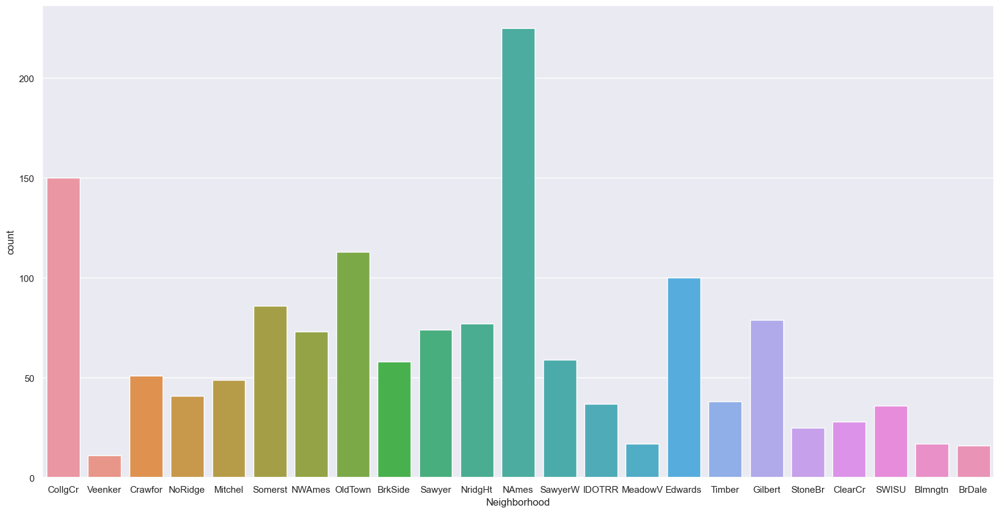

In [4998]:
sns.countplot(x='Neighborhood', data = HS)

The neighborhood of NAmes is the mode of Neighborhoods making up a proportion of 0.15, followed by CollgCr, OldTown, Edwards, and Somerst having proportions of 0.6 or higher. All of the other 18 neighborhoods make up 0.05 or less of the Neighborhoods represented in the dataset, meaning it is much more rare to see one of them than NAmes for example. 

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='Neighborhood', ylabel='SalePrice'>

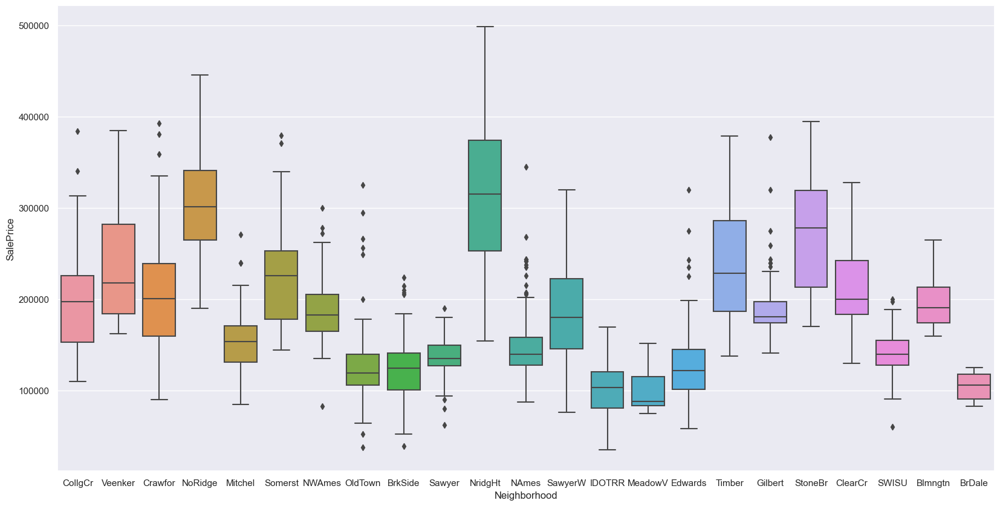

In [4999]:
sns.boxplot(x = 'Neighborhood', y = 'SalePrice', data = HS)

There is abundant variation in the medians of SalePrices for every neighborhood. NridgHt seems to have the highest meaning it is the likely the most prestigious/expensive neighborhood in the datasite. NoRidge also seems to be quite high here as well as StoneBr. Conversely, the MeadowV neighborhoods median is an extreme amount lower than some of the other neighborhoods, and looks to be the cheapest neighborhood in the dataset. While most of the medians are floating around 140,000 to 210,000, there are some well below and above that range which shows there could be a strong correlation between some of these neighboirhoods and SalePrice.

2. Finding the correlation between Neighborhoods and SalePrice.

In [5000]:
Neighborhood_Cor = HS[['Neighborhood','SalePrice_std']] # Creating new dataframe just with the two variables

In [5001]:
Neighborhood_Cor.Neighborhood = Neighborhood_Cor.Neighborhood.astype(str) # One hot encoding Neighborhood

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2043217635.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Neighborhood_Cor.Neighborhood = Neighborhood_Cor.Neighborhood.astype(str) # One hot encoding Neighborhood


In [5002]:
Neighborhood_Cor = pd.get_dummies(Neighborhood_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each MSSubClass.

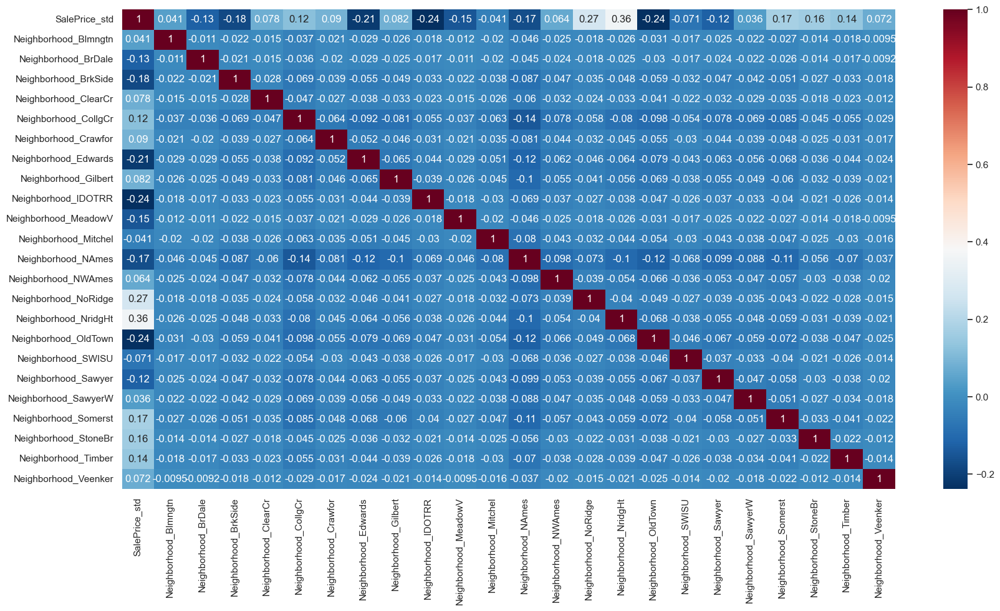

In [5003]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(Neighborhood_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show() 

The neighborhoods of NoRidge have a correlation of 0.27, NridgHt with 0.36, Somerst with 0.17, StoneBr with 0.17, Timber with 0.14, BrDale with -0.13, BrkSide with -0.18, Edwards with -0.21, IDOTRR with -0.24, MeadowV with -0.15, NAmes with -0.17, OldTown with -0.24, and finally Sawyer with -0.12. All of these correlations are significant and especially NoRidge and NrudgHt with quite strong correlations. Neighborhood will definetly be one of my top variables.

#### OverallQual

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration. We treat it as a categorical as there are not a wide array of values and the measure is subjective i.e. OverallQual could be interpretted differently by different people.

In [5004]:
print(HS['OverallQual'].value_counts())
HS['OverallQual'].value_counts(normalize = True).round(2)

OverallQual
5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: count, dtype: int64


OverallQual
5     0.27
6     0.26
7     0.22
8     0.12
4     0.08
9     0.03
3     0.01
10    0.01
2     0.00
1     0.00
Name: proportion, dtype: float64

<Axes: xlabel='OverallQual', ylabel='count'>

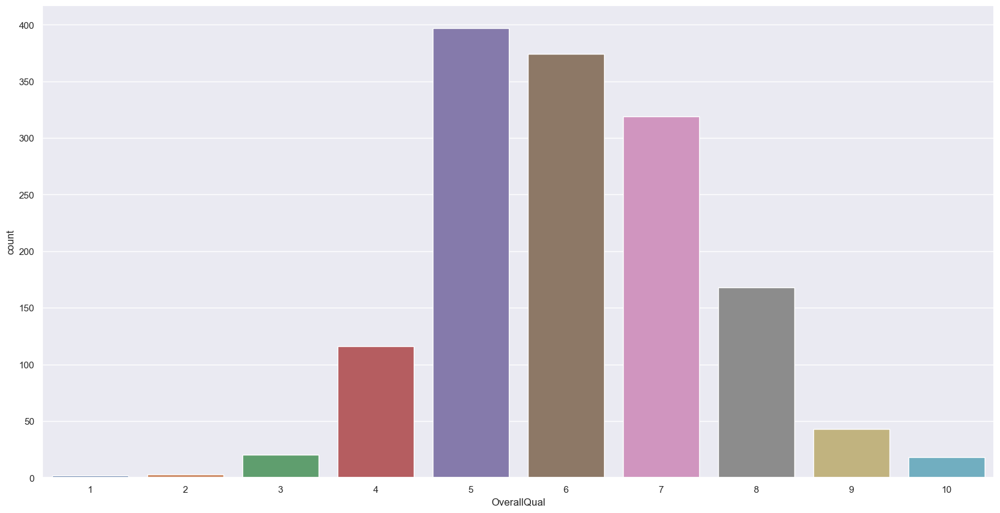

In [5005]:
sns.countplot(x='OverallQual', data = HS)

###### Cleaning:

1. OverallQual 1 and 2 are significantly underrepresented and need to be cleaned. I will compare them against SalePrice and LotArea to find the right values to replace them with.

In [5006]:
HS.groupby('OverallQual')[["SalePrice",'LotArea']].agg([np.mean, np.median])

SalePrice                 LotArea         
                      mean    median          mean   median
OverallQual                                                
1             50150.000000   50150.0   7510.000000   7510.0
2             51770.333333   60000.0   7840.000000   8400.0
3             87473.750000   86250.0   8358.550000   8359.0
4            108420.655172  108000.0   8917.982759   8487.5
5            133523.347607  133000.0  10153.352645   8892.0
6            161603.034759  160000.0  10026.649733   9327.0
7            207716.423197  200141.0  11075.799373   9600.0
8            272990.389029  269750.0  11103.839286  10748.5
9            355117.960656  335000.0  13424.186047  12919.0
10           378685.989857  394555.5  19869.944444  13786.5

2. The closest for the median and mean of both 1 and 2 is OverallQual 3, which is what I will replace those values with.

In [5007]:
HS.loc[HS.OverallQual == 1, 'OverallQual'] = 3
HS.loc[HS.OverallQual == 2, 'OverallQual'] = 3
HS['OverallQual'].value_counts()

OverallQual
5     397
6     374
7     319
8     168
4     116
9      43
3      25
10     18
Name: count, dtype: int64

In [5008]:
HS[HS.OverallQual.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


3. There are no null values and it all looks usual to me so we can move on.

###### Univariate Exploration:

1. Re-checking the proportions and countplot for OverallQual.

In [5009]:
HS['OverallQual'].value_counts(normalize = True).round(2)

OverallQual
5     0.27
6     0.26
7     0.22
8     0.12
4     0.08
9     0.03
3     0.02
10    0.01
Name: proportion, dtype: float64

<Axes: xlabel='OverallQual', ylabel='count'>

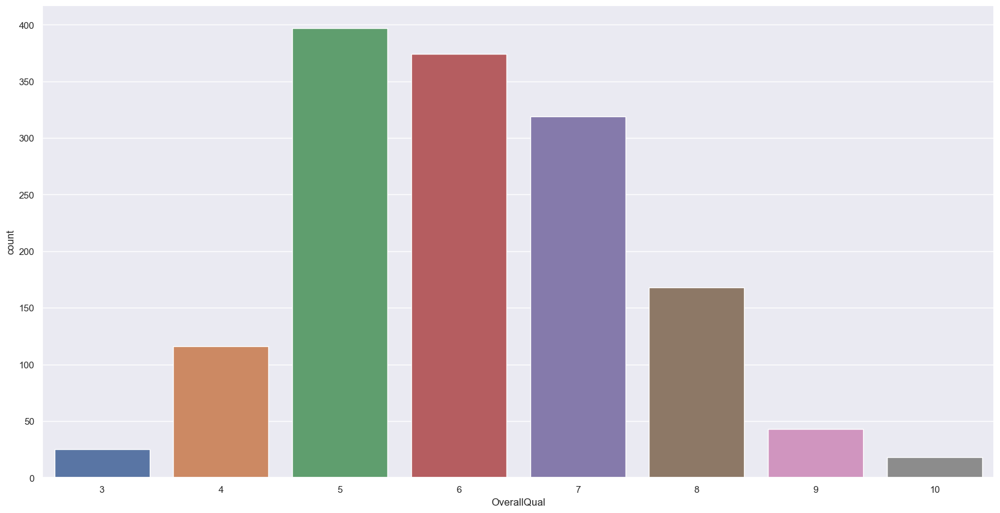

In [5010]:
sns.countplot(x='OverallQual', data = HS)

A stark majority OverallQual are floating around 5, 6, 7, which makes sense at about the middle of the pack. Really poor OverallQuall houses and high ones are more rare than just your average one. 

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='OverallQual', ylabel='SalePrice'>

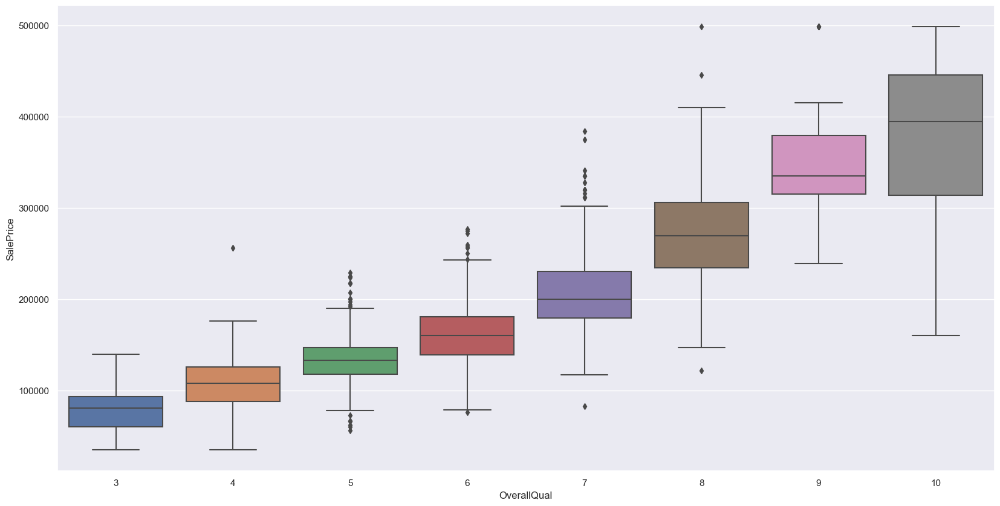

In [5011]:
sns.boxplot(x = 'OverallQual', y = 'SalePrice', data = HS)

It makes sense that as OverallQual increases, the saleprice does as well. This is what we see represented with here, each step the median is higher than the last. Showing a fairly linear relationship. This follows what one might expect, and I believe these variables with be quite correlated with SalePrice.

2. Finding the correlation between Neighborhoods and SalePrice.

In [5012]:
OverallQual_Cor = HS[['OverallQual','SalePrice_std']] # Creating new dataframe just with the two variables

In [5013]:
OverallQual_Cor.OverallQual = OverallQual_Cor.OverallQual.astype(str) # One hot encoding MSSubClass

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2005440795.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OverallQual_Cor.OverallQual = OverallQual_Cor.OverallQual.astype(str) # One hot encoding MSSubClass


In [5014]:
OverallQual_Cor = pd.get_dummies(OverallQual_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each MSSubClass.

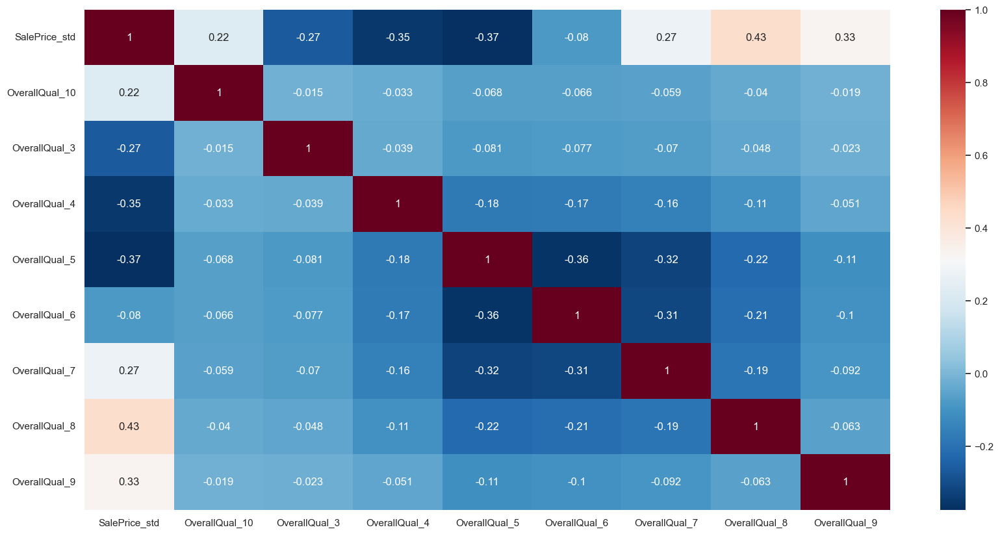

In [5015]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(OverallQual_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show() 

All OverallQuals are correlated significantly, other than 6, positively or negatively, to SalePrice. The most notable is OverQuall_8 and _9 with 0.43 and 0.33 correlation repsectively, as wellas _5 with -0.37. This might be the highest correlation when it is all set and done. This for sure will be a top one I use. OverallQual_10 also has quite a notable correlation of 0.22.

#### OverallCond

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration. For the same reasons as OverallQual we will treat it as a categorical variable.

In [5016]:
print(HS['OverallCond'].value_counts())
HS['OverallCond'].value_counts(normalize = True).round(2)

OverallCond
5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: count, dtype: int64


OverallCond
5    0.56
6    0.17
7    0.14
8    0.05
4    0.04
3    0.02
9    0.02
2    0.00
1    0.00
Name: proportion, dtype: float64

<Axes: xlabel='OverallCond', ylabel='count'>

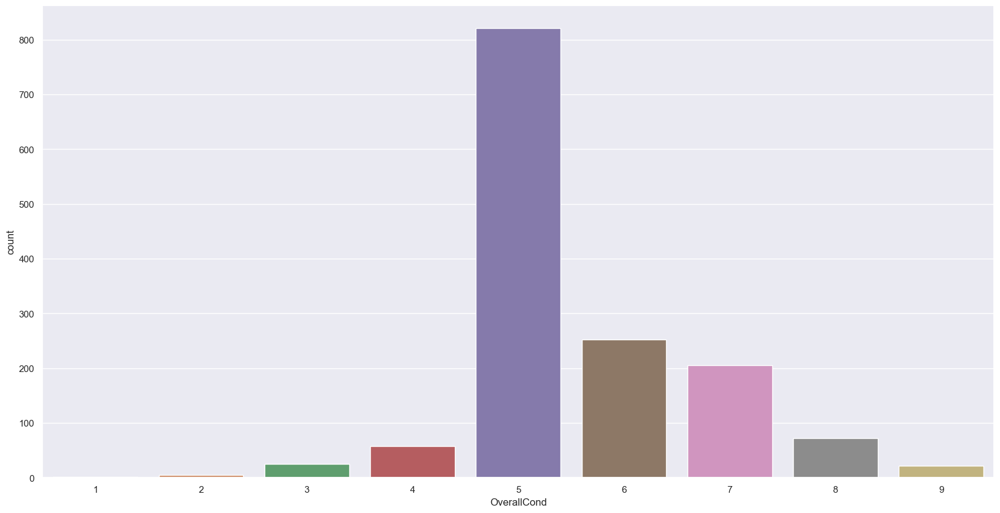

In [5017]:
sns.countplot(x='OverallCond', data = HS) 

###### Cleaning:

1. The OverallCond of 2 and 1 are underrepresnted with counts of under 10 so I will look at all the OverallCond and their SalePrices.  

In [5018]:
HS.groupby('OverallCond')[["SalePrice"]].agg([np.mean, np.median])

SalePrice          
                      mean    median
OverallCond                         
1             61000.000000   61000.0
2            141986.400000   85000.0
3            101929.400000   89500.0
4            120438.438596  115000.0
5            201478.959846  185000.0
6            152735.427607  142750.0
7            158145.487805  145000.0
8            155651.736111  142500.0
9            205730.395086  176200.0

2. Again, 1 is closest to 3 in terms of both its mean and median sale prices. However, the mean for 2 is quite skewed as the mean is much higher than the median. The closest median value, which makes the most sense to use as a result of the skew, is also 3 so I will replace both OverallQuall 1 and 2 wih 3.

In [5019]:
HS.loc[HS.OverallCond == 1, 'OverallCond'] = 3
HS.loc[HS.OverallCond == 2, 'OverallCond'] = 3
HS['OverallCond'].value_counts()

OverallCond
5    821
6    252
7    205
8     72
4     57
3     31
9     22
Name: count, dtype: int64

In [5020]:
HS[HS.OverallCond.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


3. I checked for null values so there are none and the data is properly cleaned.

###### Univariate Exploration:

1. Re-checking the proportions and countplot for OverallCond.

In [5021]:
HS['OverallCond'].value_counts(normalize = True).round(2)

OverallCond
5    0.56
6    0.17
7    0.14
8    0.05
4    0.04
3    0.02
9    0.02
Name: proportion, dtype: float64

<Axes: xlabel='OverallCond', ylabel='count'>

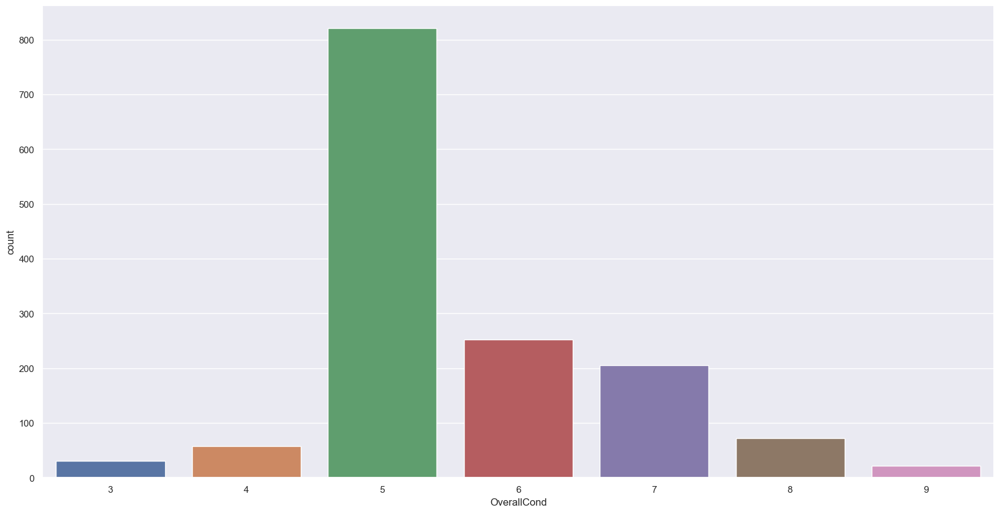

In [5022]:
sns.countplot(x='OverallCond', data = HS)

By far most of the values belong to the OverallCond of 5, representing 56% of the dataset. OverallCond 6 and 7 also make up a singificant portion with 0.17 and 0.14 proportions respectively. So much of the data set is just in these 3 OverallCond, the rest of OverallCond makes up 13% all together.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='OverallCond', ylabel='SalePrice'>

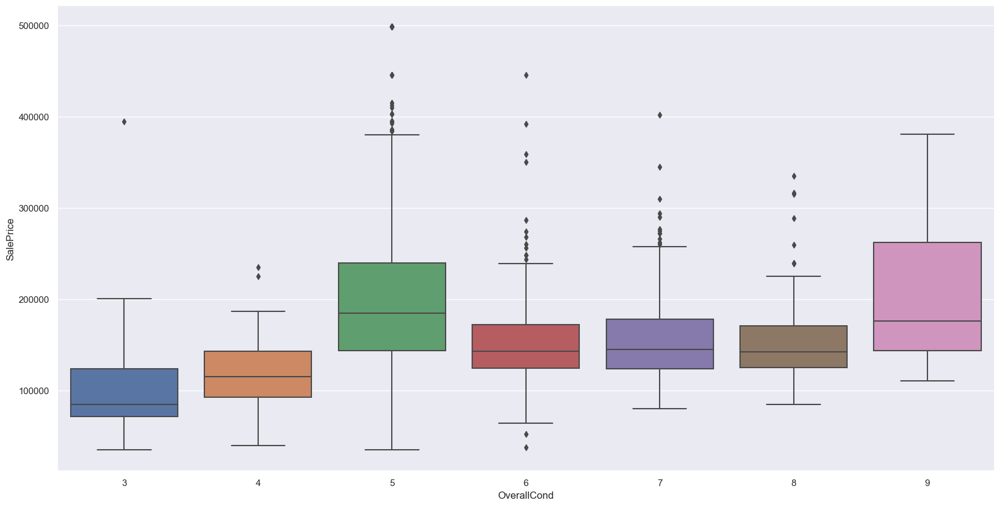

In [5023]:
sns.boxplot(x = 'OverallCond', y = 'SalePrice', data = HS)

The low OverallCond values of 3 and 4 look like they might have a negative correlation with SalePrice. It also looks as though OverallCond 9 might have a positive correlation as well, however, 5 is also interesting as it looks to have the highest SalePrice median out of all of them. I will check now.

2. The correlation between OverallCond and SalePrice.

In [5024]:
OverallCond_Cor = HS[['OverallCond','SalePrice_std']] # Creating new dataframe just with the two variables

In [5025]:
OverallCond_Cor.OverallCond = OverallCond_Cor.OverallCond.astype(str) # One hot encoding OverallCond

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/469072375.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OverallCond_Cor.OverallCond = OverallCond_Cor.OverallCond.astype(str) # One hot encoding OverallCond


In [5026]:
OverallCond_Cor = pd.get_dummies(OverallCond_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each OverallCond.

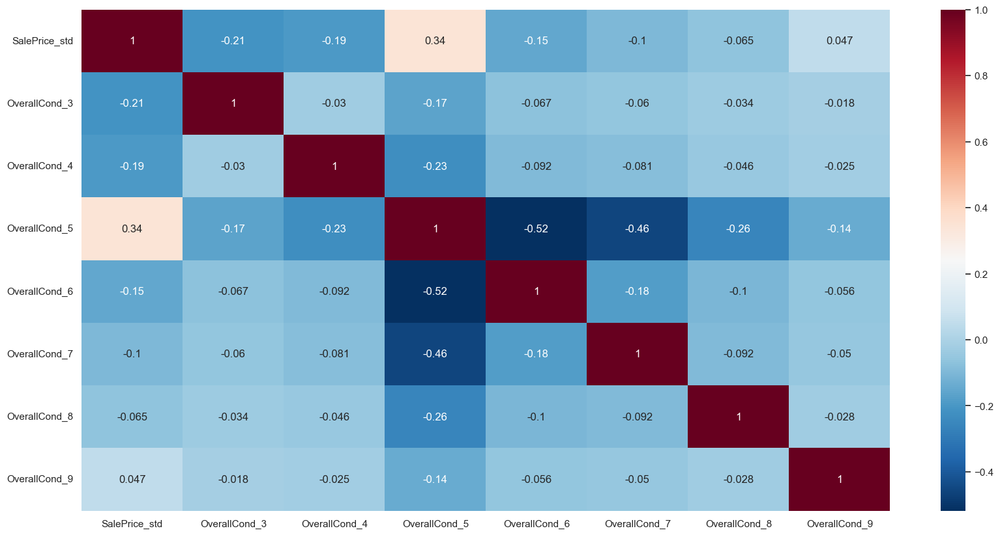

In [5027]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(OverallCond_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show() 

All overallCond other than 8 9, 1, and 2, have correlations worth noting. The most notable however, is OverallCond_5, with a correlation of 0.34. From a logical standpoint, I do not get why this would be much more highly correlated than OverallCond_9 for example. For this reason, it is unlikely I will use this variable as one of my best ones.

#### Exterior1st

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration. 

In [5028]:
print(HS['Exterior1st'].value_counts())
HS['Exterior1st'].value_counts(normalize = True).round(2)

Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: count, dtype: int64


Exterior1st
VinylSd    0.35
HdBoard    0.15
MetalSd    0.15
Wd Sdng    0.14
Plywood    0.07
CemntBd    0.04
BrkFace    0.03
WdShing    0.02
Stucco     0.02
AsbShng    0.01
BrkComm    0.00
Stone      0.00
AsphShn    0.00
ImStucc    0.00
CBlock     0.00
Name: proportion, dtype: float64

<Axes: xlabel='Exterior1st', ylabel='count'>

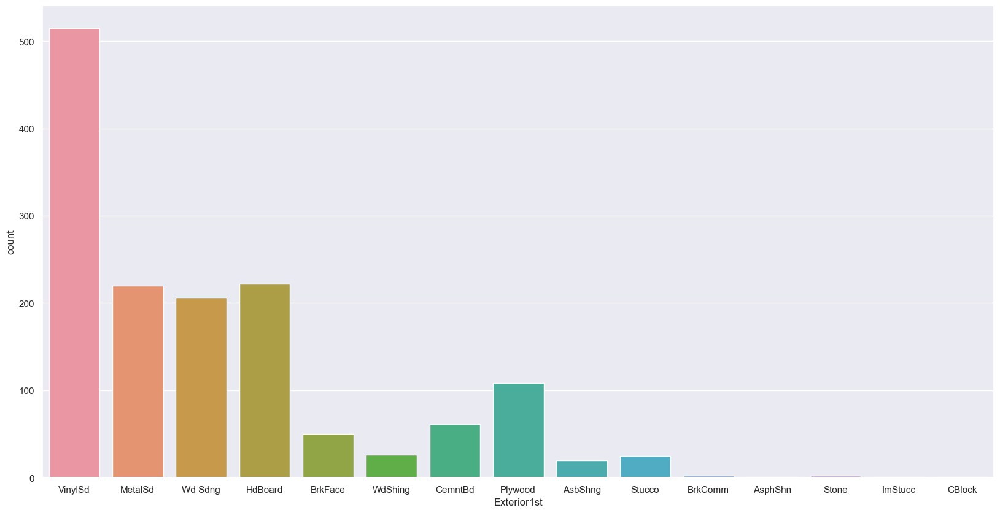

In [5029]:
sns.countplot(x='Exterior1st', data = HS)

###### Cleaning:

1. As we can see, BrkComm, Stone, AsphShn, ImStucc and CBlock all need to be cleaned. 

In [5030]:
HS.groupby('Exterior1st')[["SalePrice",'LotArea']].agg([np.mean, np.median])

SalePrice                 LotArea         
                      mean    median          mean   median
Exterior1st                                                
AsbShng      107385.550000  108000.0   7758.800000   8513.0
AsphShn      100000.000000  100000.0   9825.000000   9825.0
BrkComm       71000.000000   71000.0   9888.500000   9888.5
BrkFace      194893.135137  165750.0  14959.100000   9574.5
CBlock       105000.000000  105000.0   5400.000000   5400.0
CemntBd      225284.154428  236500.0   9198.540984   8640.0
HdBoard      160879.313125  149900.0  10278.243243   9754.0
ImStucc      262000.000000  262000.0  12461.000000  12461.0
MetalSd      149422.177273  139000.0   8611.622727   8402.5
Plywood      175942.379630  167450.0  14442.722222  10505.0
Stone        258500.000000  258500.0  14806.500000  14806.5
Stucco       162990.000000  144000.0  11621.000000   8544.0
VinylSd      212729.765715  200000.0   9904.660194   9591.0
Wd Sdng      147292.982761  138943.5  11721.762136   9600.0
WdShing      150655.076923  128700.0  10423.153846   8648.5

2. For BrkComm, AsphShn, and CBlock, I will replace their Exterior1st with AsbShng as this is the Exterior1st that was most consistent with the SalePrice for all of them. For Stone and ImStucc I replaced them with a differnt one, CemntBd, but for the same reason.

In [5031]:
HS.loc[HS.Exterior1st == 'BrkComm', 'Exterior1st'] = 'AsbShng'
HS.loc[HS.Exterior1st == 'AsphShn', 'Exterior1st'] = 'AsbShng'
HS.loc[HS.Exterior1st == 'CBlock', 'Exterior1st'] = 'AsbShng'
HS.loc[HS.Exterior1st == 'Stone', 'Exterior1st'] = 'CemntBd'
HS.loc[HS.Exterior1st == 'ImStucc', 'Exterior1st'] = 'CemntBd'

HS['Exterior1st'].value_counts()

Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     64
BrkFace     50
WdShing     26
Stucco      25
AsbShng     24
Name: count, dtype: int64

3. Check for Nulls. 

In [5032]:
HS[HS.Exterior1st.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


###### Univariate Exploration:

1. Re-checking the proportions and countplot for Exterior1st.

In [5033]:
HS['Exterior1st'].value_counts(normalize = True).round(2)

Exterior1st
VinylSd    0.35
HdBoard    0.15
MetalSd    0.15
Wd Sdng    0.14
Plywood    0.07
CemntBd    0.04
BrkFace    0.03
WdShing    0.02
Stucco     0.02
AsbShng    0.02
Name: proportion, dtype: float64

<Axes: xlabel='Exterior1st', ylabel='count'>

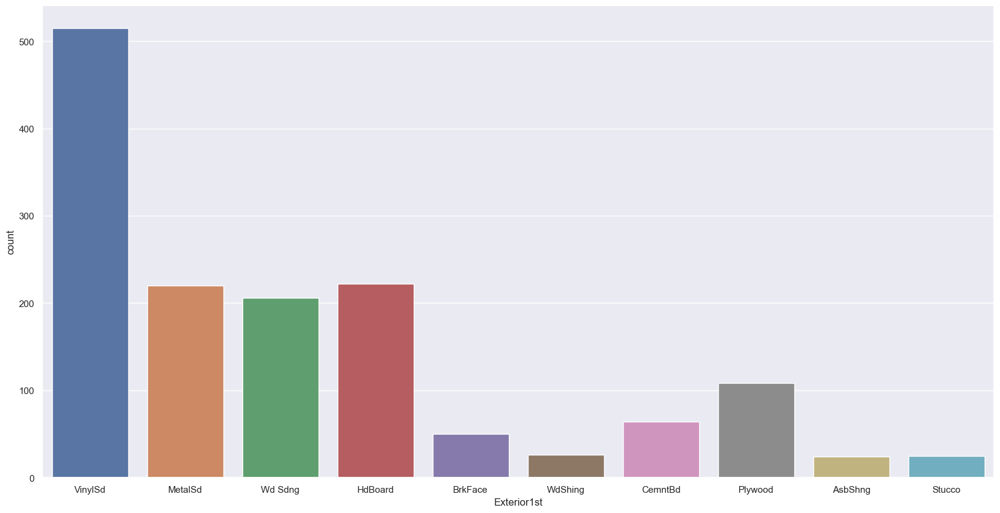

In [5034]:
sns.countplot(x='Exterior1st', data = HS)

The VinylSd Exterior1st is the mode for this dataset making up 35% of all houses. It is pretty consistent for counts between HdBoard, MetalSd, and Wd Sdng, all with about 0.14/0.15 proportions. Every other value is fairly rare, but none are too low. It will be interesting to see them compared with sale price.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='Exterior1st', ylabel='SalePrice'>

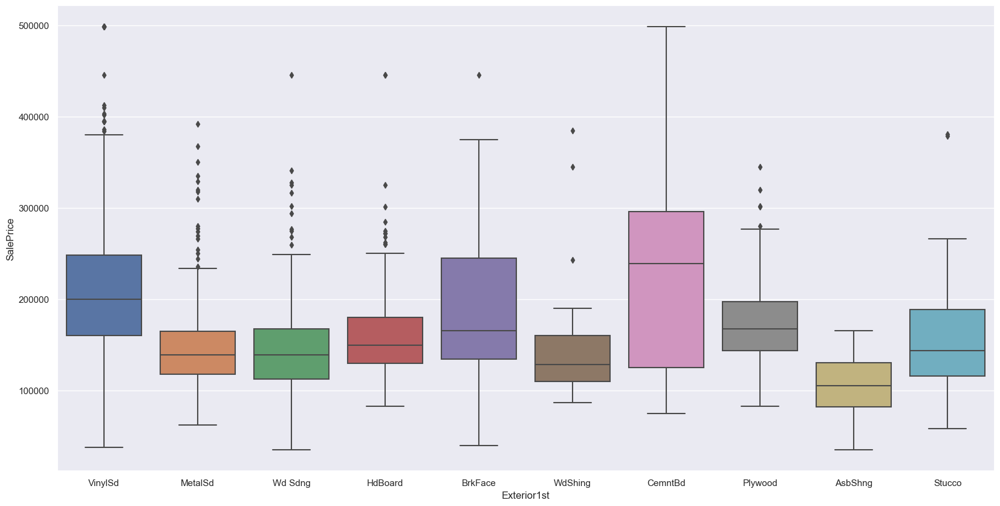

In [5035]:
sns.boxplot(x = 'Exterior1st', y = 'SalePrice', data = HS)

The Exterior1st of CemntBd looks to have a pretty significant median value above the rest of the Exterior1st, while AsbShng has quite a low one. Most of the others have quite similar ones, with VinylSd also quite high, which is interesting as its range looks to be the largest. 

2. The correlation between SalePrice and Exterior1st.

In [5036]:
Exterior1st_Cor = HS[['Exterior1st','SalePrice_std']] # Creating new dataframe just with the two variables

In [5037]:
Exterior1st_Cor.Exterior1st = Exterior1st_Cor.Exterior1st.astype(str) # One hot encoding Exterior1st

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3470763799.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Exterior1st_Cor.Exterior1st = Exterior1st_Cor.Exterior1st.astype(str) # One hot encoding Exterior1st


In [5038]:
Exterior1st_Cor = pd.get_dummies(Exterior1st_Cor)

3. Now I will create a heatmap to uncover the correlations for sale price and each Exterior1st.

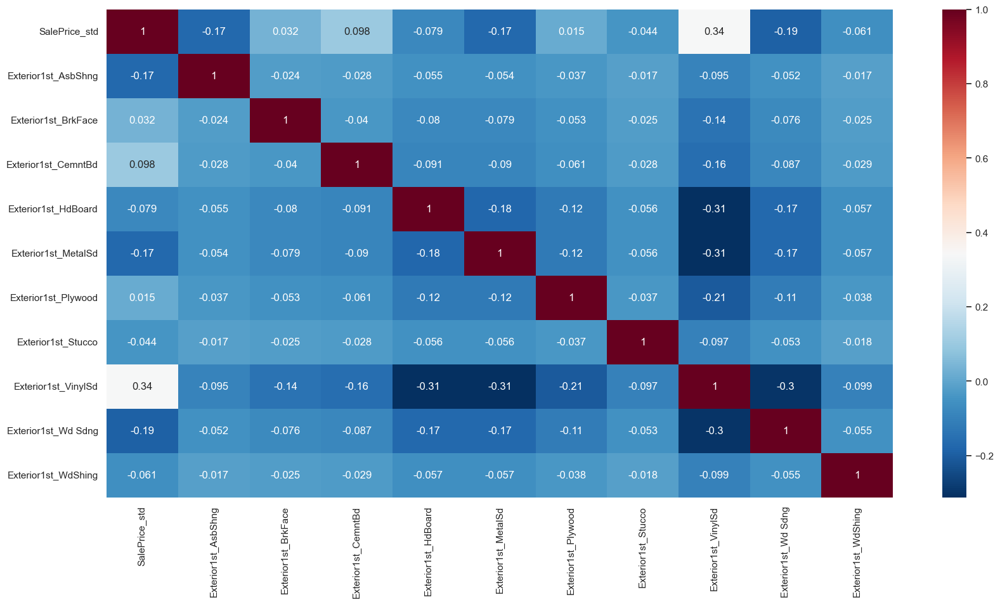

In [5039]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(Exterior1st_Cor.corr(), annot = True, cmap="RdBu_r")
plt.show() 

Exterior1st VinylSd has a great correlation of 0.34, which is one of the higher ones so far. The 0.14 for CemntBd, MetalSd with -0.17, AsbShng with -0.15, and Wd Sdng with -0.19, are all notable correlations that could be one of our top variables. This might make sense with the type of materials costing more than others, which could explain the correlations. 

#### 1stFlrSF

###### Exploration:

1. First I will check the descriptive statistics, the boxplot to show outliers, and kdeplot to show skewing as LotFrontage is a numeric variable.

In [5040]:
HS.agg(
        {
            '1stFlrSF':['min','mean', 'median','max','std'],
        }).round(2)

,1stFlrSF
min,334.00
mean,1162.63
median,1087.00
max,4692.00
std,386.59


In [5041]:
FstFlrSF_mean = HS['1stFlrSF'].mean()
FstFlrSF_std = HS['1stFlrSF'].std()

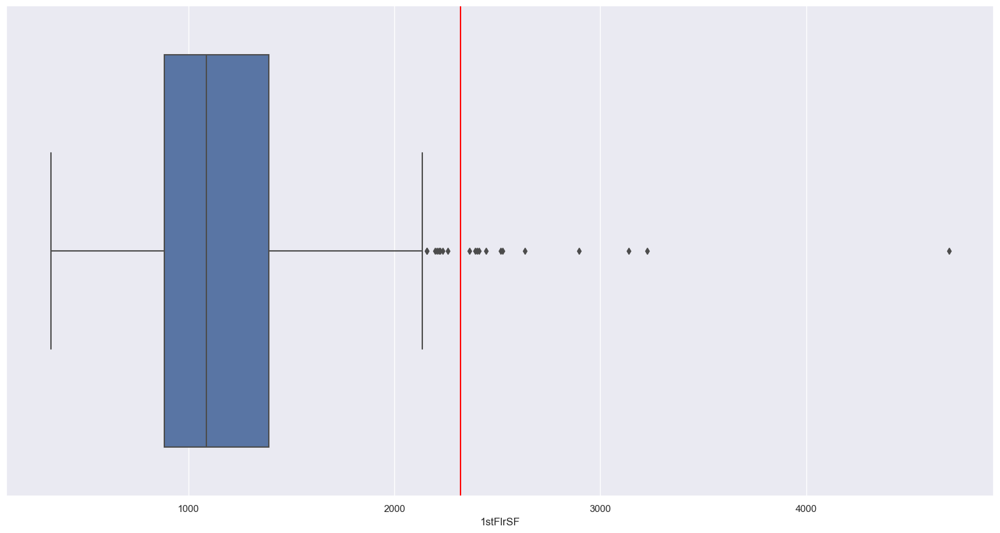

In [5042]:
x = sns.boxplot(x='1stFlrSF', data = HS)
x = x.axvline(FstFlrSF_mean + 3* FstFlrSF_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

<Axes: xlabel='1stFlrSF', ylabel='Density'>

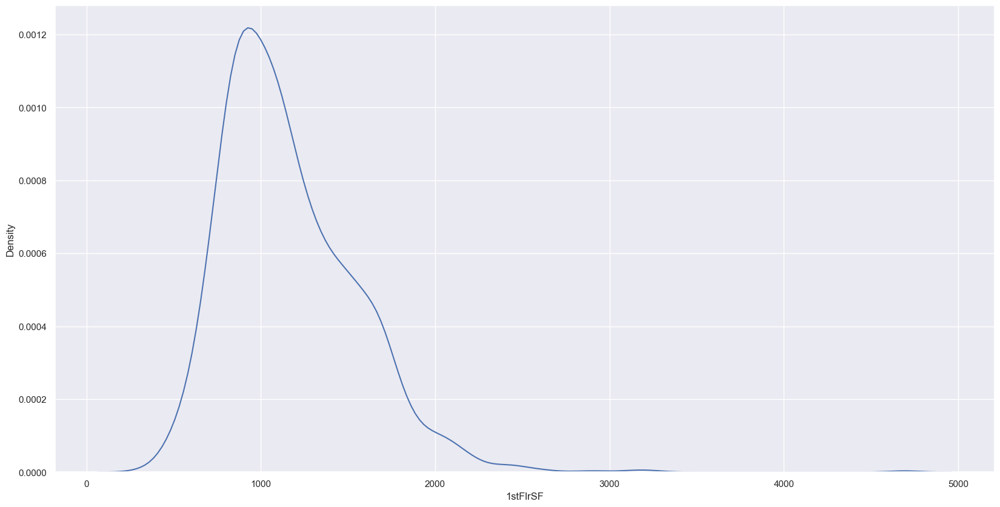

In [5043]:
sns.kdeplot(x='1stFlrSF', data = HS)

###### Cleaning:

1. As we can tell from the Boxplot there are some outliers that need to be cleaned. I will use the same method I have to clean it.

In [5044]:
HS.groupby("Neighborhood")["1stFlrSF"].agg(['mean', 'median','std']).round(0)

,mean,median,std
Neighborhood,,,
Blmngtn,1428.0,1500.0,138.0
BrDale,584.0,578.0,106.0
BrkSide,915.0,926.0,189.0
ClearCr,1307.0,1305.0,271.0
CollgCr,1165.0,1068.0,320.0
Crawfor,1265.0,1152.0,445.0
Edwards,1093.0,990.0,509.0
Gilbert,943.0,884.0,245.0
IDOTRR,835.0,803.0,194.0


In [5045]:
(HS[HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std])

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std
224,20,103.000000,13472,Reg,Inside,NridgHt,10,5,VinylSd,2392,0,TA,968,386250.000000,0,0,2,0,12.419487,2.145298,27.893791,1.130288
440,20,105.000000,15431,Reg,Inside,NridgHt,10,5,VinylSd,2402,0,TA,672,498515.629354,1,0,2,0,12.657033,2.792260,28.253013,1.168197
496,20,0.000000,12692,IR1,Inside,NoRidge,8,5,BrkFace,3228,0,TA,546,446006.756854,1,0,3,0,12.553452,2.510156,-1.214784,-1.941601
523,60,130.000000,40094,IR1,Inside,Edwards,10,5,CemntBd,3138,1538,TA,884,184750.000000,1,0,3,1,11.731009,0.270216,32.549494,1.621614
529,20,0.000000,32668,IR1,CulDSac,Crawfor,6,3,Wd Sdng,2515,0,TA,484,200624.000000,1,0,3,0,11.808099,0.480174,-1.214784,-1.941601
691,60,104.000000,21535,IR1,Corner,NoRidge,10,6,HdBoard,2444,1872,TA,832,446006.756854,0,1,3,1,12.553452,2.510156,28.073721,1.149276
898,20,100.000000,12919,IR1,Inside,NridgHt,9,5,VinylSd,2364,0,TA,820,498515.629354,1,0,2,1,12.657033,2.792260,27.350088,1.072910
1024,20,0.000000,15498,IR1,Corner,Timber,8,6,CemntBd,2898,0,TA,665,287000.000000,1,0,2,0,12.142555,1.391070,-1.214784,-1.941601
1044,20,80.000000,9600,Reg,Inside,NWAmes,8,5,BrkFace,2524,0,TA,542,278000.000000,1,0,2,1,12.112820,1.310086,23.556956,0.672613
1182,60,137.240727,15623,IR1,Corner,NoRidge,10,5,Wd Sdng,2411,2065,TA,813,446006.756854,1,0,3,1,12.553452,2.510156,33.735114,1.746735


###### Cleaning with each outliers grouped mean based on what neighborhood the house is in:

1. NridgHt: 

In [5046]:
NridgHt_1stFlrSF_mean = HS[(HS.Neighborhood == "NridgHt") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
NridgHt_1stFlrSF_mean

1547.081081081081

In [5047]:
NridgHt_1stFlrSF_std = HS[(HS.Neighborhood == "NridgHt") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
NridgHt_1stFlrSF_std

339.79170721885737

In [5048]:
Replacement_FfSf_NridgHt = NridgHt_1stFlrSF_mean + 3 * NridgHt_1stFlrSF_std
Replacement_FfSf_NridgHt

2566.4562027376533

In [5049]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "NridgHt"), "1stFlrSF"] = Replacement_FfSf_NridgHt 

2. NoRidge:

In [5050]:
NoRidge_1stFlrSF_mean = HS[(HS.Neighborhood == "NoRidge") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
NoRidge_1stFlrSF_mean

1400.054054054054

In [5051]:
NoRidge_1stFlrSF_std = HS[(HS.Neighborhood == "NoRidge") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
NoRidge_1stFlrSF_std

304.7054995260857

In [5052]:
Replacement_FfSf_NoRidge = NoRidge_1stFlrSF_mean + 3 * NoRidge_1stFlrSF_std
Replacement_FfSf_NoRidge

2314.1705526323112

In [5053]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "NoRidge"), "1stFlrSF"] = Replacement_FfSf_NoRidge 

3. Edwards:

In [5054]:
Edwards_1stFlrSF_mean = HS[(HS.Neighborhood == "Edwards") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
Edwards_1stFlrSF_mean

1035.469387755102

In [5055]:
Edwards_1stFlrSF_std = HS[(HS.Neighborhood == "Edwards") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
Edwards_1stFlrSF_std

289.8874720920343

In [5056]:
Replacement_FfSf_Edwards = Edwards_1stFlrSF_mean + 3 * Edwards_1stFlrSF_std
Replacement_FfSf_Edwards

1905.1318040312049

In [5057]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "Edwards"), "1stFlrSF"] = Replacement_FfSf_Edwards 

4. Crawfor: 

In [5058]:
Crawfor_1stFlrSF_mean = HS[(HS.Neighborhood == "Crawfor") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
Crawfor_1stFlrSF_mean

1239.72

In [5059]:
Crawfor_1stFlrSF_std = HS[(HS.Neighborhood == "Crawfor") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
Crawfor_1stFlrSF_std

411.38913699904174

In [5060]:
Replacement_FfSf_Crawfor = Crawfor_1stFlrSF_mean + 3 * Crawfor_1stFlrSF_std
Replacement_FfSf_Crawfor

2473.8874109971252

In [5061]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "Crawfor"), "1stFlrSF"] = Replacement_FfSf_Crawfor 

5. Timber: 

In [5062]:
Timber_1stFlrSF_mean = HS[(HS.Neighborhood == "Timber") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
Timber_1stFlrSF_mean

1424.918918918919

In [5063]:
Timber_1stFlrSF_std = HS[(HS.Neighborhood == "Timber") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
Timber_1stFlrSF_std

350.9911662688946

In [5064]:
Replacement_FfSf_Timber = Timber_1stFlrSF_mean + 3 * Timber_1stFlrSF_std
Replacement_FfSf_Timber

2477.8924177256026

In [5065]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "Timber"), "1stFlrSF"] = Replacement_FfSf_Timber 

6. NWAmes:

In [5066]:
NWAmes_1stFlrSF_mean = HS[(HS.Neighborhood == "NWAmes") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].mean()
NWAmes_1stFlrSF_mean

1299.7222222222222

In [5067]:
NWAmes_1stFlrSF_std = HS[(HS.Neighborhood == "NWAmes") &
                               (HS['1stFlrSF'] < FstFlrSF_mean + 3* FstFlrSF_std)]["1stFlrSF"].std()
NWAmes_1stFlrSF_std

316.9988324598494

In [5068]:
Replacement_FfSf_NWAmes = NWAmes_1stFlrSF_mean + 3 * NWAmes_1stFlrSF_std
Replacement_FfSf_NWAmes

2250.7187196017703

In [5069]:
HS.loc[(HS['1stFlrSF'] > FstFlrSF_mean + 3* FstFlrSF_std) & 
       (HS.Neighborhood == "NWAmes"), "1stFlrSF"] = Replacement_FfSf_NWAmes 

###### Outliers have been cleaned

2. The outliers have now been removed. Now, I will check for null values.

In [5070]:
HS[HS['1stFlrSF'].isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std


3. There are no null values, outliers have been cleaned, and all values look like they make sense to me. Now I will use boxcox to better have 1stFlrSF follow a normal distribution.

In [5071]:
FstFlrSF_Transformed, best_lambda = boxcox(HS['1stFlrSF'])  

In [5072]:
HS["FstFlrSF_Trans"] = FstFlrSF_Transformed

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/169371317.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["FstFlrSF_Trans"] = FstFlrSF_Transformed


4. Now that the data is cleaned and bests follows a normal distribution, I will save the standard deviation values (z-scores) for each individual value to help me in the future.

In [5073]:
scaler = StandardScaler()
HS["1stFlrSF_std"] = scaler.fit_transform(HS[['FstFlrSF_Trans']])
HS[["1stFlrSF_std", "1stFlrSF",'FstFlrSF_Trans']].head(10)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/370344882.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["1stFlrSF_std"] = scaler.fit_transform(HS[['FstFlrSF_Trans']])


,1stFlrSF_std,1stFlrSF,FstFlrSF_Trans
0,-0.810733,856.0,7.347804
1,0.425189,1262.0,7.808621
2,-0.582061,920.0,7.433065
3,-0.443585,961.0,7.484696
4,0.114307,1145.0,7.692708
5,-1.040795,796.0,7.262025
6,1.370434,1694.0,8.161059
7,0.006637,1107.0,7.652563
8,-0.247874,1022.0,7.557668
9,-0.080944,1077.0,7.619908


###### Univariate Exploration:

1. I will begin by re-checking the descriptive statistics, KDE, and boxplot.

In [5074]:
HS.agg(
        {
            '1stFlrSF':['min','mean', 'median','max','std'],
        }).round(2)

,1stFlrSF
min,334.00
mean,1158.74
median,1087.00
max,2566.46
std,368.21


<Axes: xlabel='1stFlrSF', ylabel='Density'>

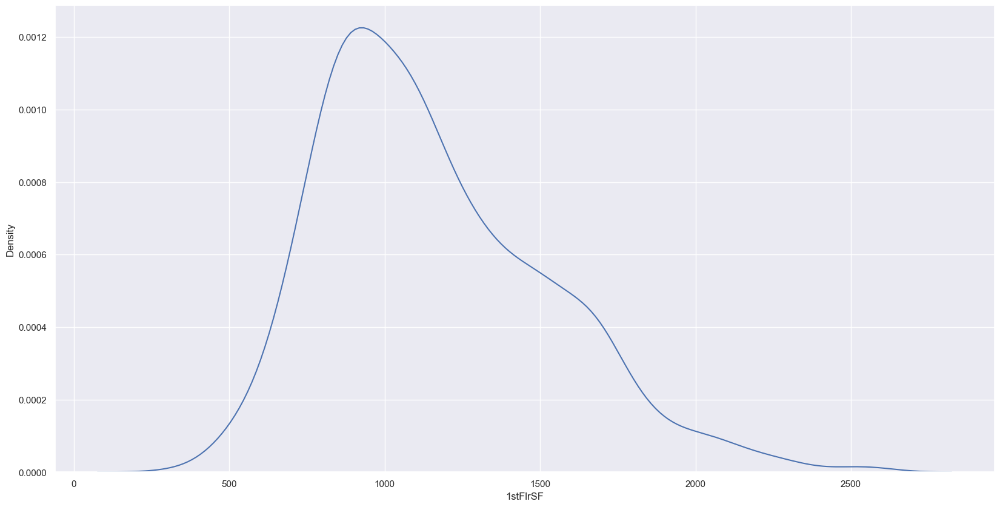

In [5075]:
sns.kdeplot(x='1stFlrSF', data = HS)

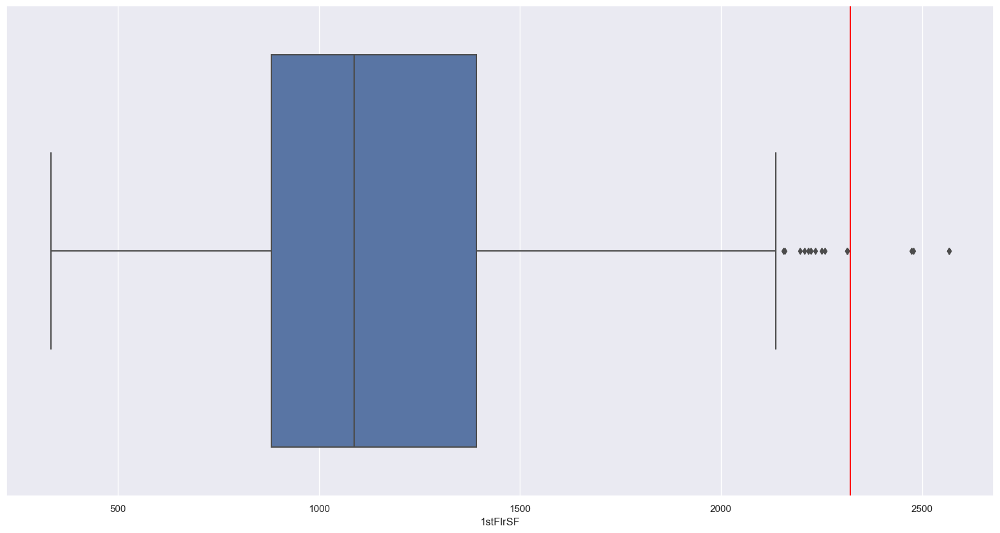

In [5076]:
x = sns.boxplot(x='1stFlrSF', data = HS)
x = x.axvline(FstFlrSF_mean + 3* FstFlrSF_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

We can see in general the distibution is approaching normality. It is much better than before we had cleaned it, however, it still has a slight right skew. This is another one where I would feel more comfortable using the median as my measure of central tendency. The values that hold the highest z-scores are all towards the higher end rather than lower end of SalePrice. 

###### Bivariate Exploration:

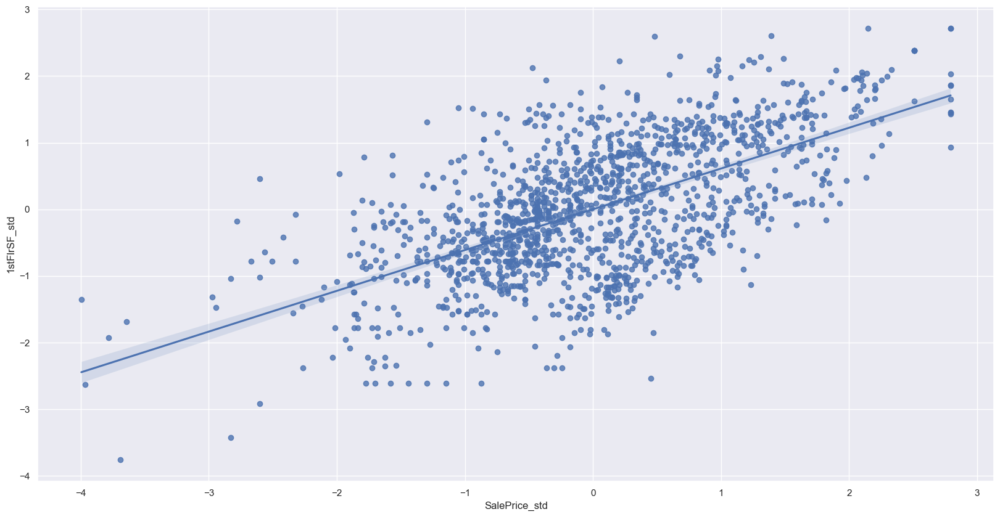

In [5077]:
sns.regplot(x= "SalePrice_std", y = "1stFlrSF_std", data = HS)    
plt.show()           

In [5078]:
FstFlrSF_Corr = HS[['1stFlrSF_std','SalePrice_std']]

In [5079]:
FstFlrSF_Corr.corr()

,1stFlrSF_std,SalePrice_std
1stFlrSF_std,1.000000,0.612039
SalePrice_std,0.612039,1.000000


The correlation between SalePrice and 1stFlrSF_std is one of the highest I have had so far. ~ 0.612 as the correlation is quite strong and will definetely be a top variable I use. This logically makes sense as more square footage on the 1st floor should mean a higher salesprice.

#### 2ndFlrSF

###### Exploration:

1. First I will check the descriptive statistics, the boxplot to show outliers, and kdeplot to show skewing as 2ndFlrSF is a numeric variable.

In [5080]:
HS.agg(
        {
            '2ndFlrSF':['min','mean', 'median','max','std'],
        }).round(2)

,2ndFlrSF
min,0.00
mean,346.99
median,0.00
max,2065.00
std,436.53


In [5081]:
SndFlrSF_mean = HS['2ndFlrSF'].mean()
SndFlrSF_std = HS['2ndFlrSF'].std()

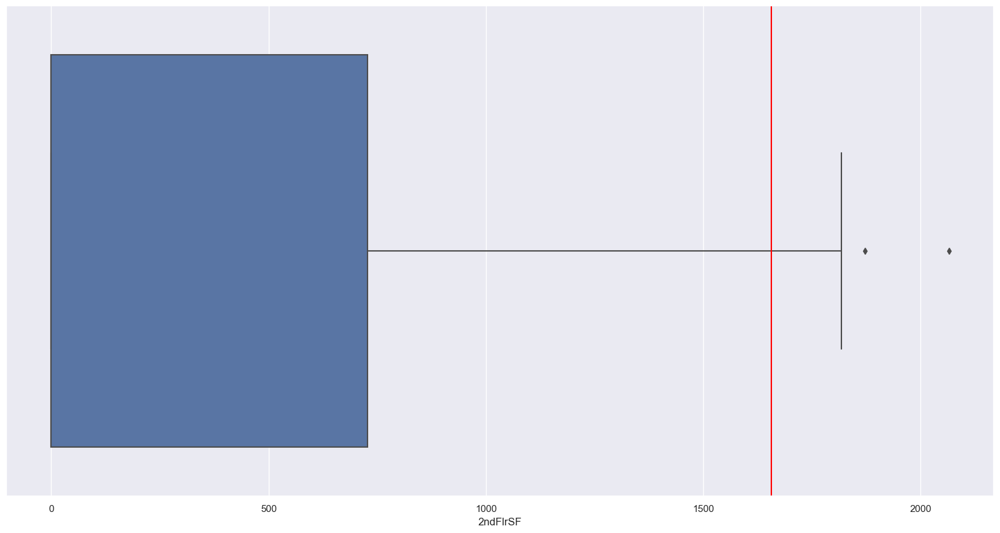

In [5082]:
x = sns.boxplot(x='2ndFlrSF', data = HS)
x = x.axvline(SndFlrSF_mean + 3* SndFlrSF_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

<Axes: xlabel='2ndFlrSF', ylabel='Density'>

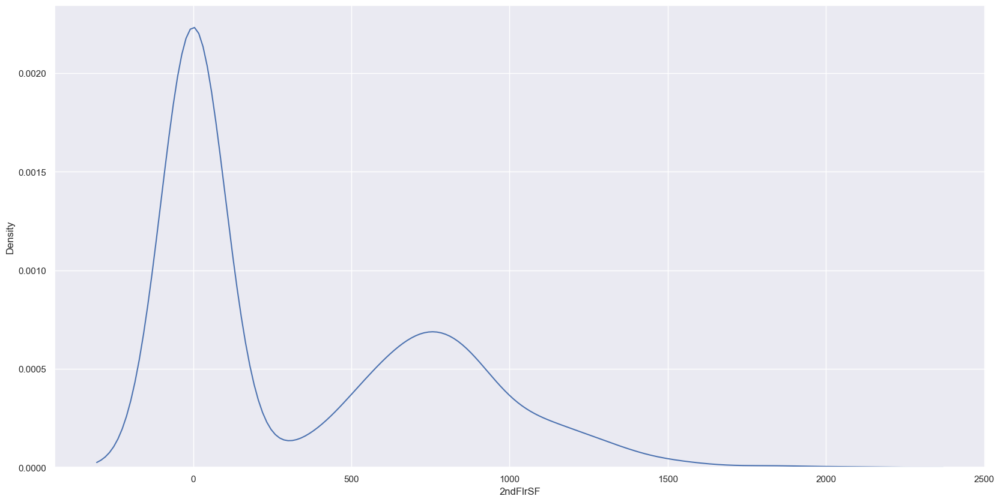

In [5083]:
sns.kdeplot(x='2ndFlrSF', data = HS)

###### Cleaning:

1. As we can tell from the Boxplot there are some outliers that need to be cleaned. I will clean using the median 2ndFlrSf based on the neighborhood the house is in, as I am sure the sizes vary based on what area they are in. I will replace by each neighborhoods mean value + 3 standard deviations

In [5084]:
HS.groupby("Neighborhood")["2ndFlrSF"].agg(['mean', 'median','std']).round(0)

,mean,median,std
Neighborhood,,,
Blmngtn,0.0,0.0,0.0
BrDale,559.0,546.0,65.0
BrkSide,279.0,218.0,292.0
ClearCr,464.0,330.0,478.0
CollgCr,316.0,0.0,439.0
Crawfor,519.0,651.0,464.0
Edwards,247.0,0.0,355.0
Gilbert,698.0,728.0,340.0
IDOTRR,277.0,319.0,288.0


In [5085]:
(HS[HS['2ndFlrSF'] > SndFlrSF_mean + 3* SndFlrSF_std])

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std
304,75,87.000000,18386,Reg,Inside,OldTown,7,9,CemntBd,1675.000000,1818,TA,870,295000.000000,0,0,3,0,12.168209,1.460939,24.920584,0.816519,8.147508,1.334091
691,60,104.000000,21535,IR1,Corner,NoRidge,10,6,HdBoard,2314.170553,1872,TA,832,446006.756854,0,1,3,1,12.553452,2.510156,28.073721,1.149276,8.537330,2.379600
1169,60,118.000000,35760,IR1,CulDSac,NoRidge,10,5,HdBoard,1831.000000,1796,TA,807,446006.756854,1,0,3,1,12.553452,2.510156,30.529322,1.408421,8.254590,1.621286
1182,60,137.240727,15623,IR1,Corner,NoRidge,10,5,Wd Sdng,2314.170553,2065,TA,813,446006.756854,1,0,3,1,12.553452,2.510156,33.735114,1.746735,8.537330,2.379600


###### Cleaning with each outliers grouped mean based on what neighborhood the house is in:

1. OldTown: 

In [5086]:
OldTown_2ndFlrSF_mean = HS[(HS.Neighborhood == "OldTown") &
                               (HS['2ndFlrSF'] < SndFlrSF_mean + 3* SndFlrSF_std)]["2ndFlrSF"].mean()
OldTown_2ndFlrSF_mean

476.2767857142857

In [5087]:
OldTown_2ndFlrSF_std = HS[(HS.Neighborhood == "OldTown") &
                               (HS['2ndFlrSF'] < SndFlrSF_mean + 3* SndFlrSF_std)]["2ndFlrSF"].std()
OldTown_2ndFlrSF_std

402.25092365632696

In [5088]:
Replacement_OldTown_2ndFlrSF = OldTown_2ndFlrSF_mean + 3 * OldTown_2ndFlrSF_std
Replacement_OldTown_2ndFlrSF

1683.0295566832667

In [5089]:
HS.loc[(HS['2ndFlrSF'] > SndFlrSF_mean + 3* SndFlrSF_std) & 
       (HS.Neighborhood == "OldTown"), "2ndFlrSF"] = Replacement_OldTown_2ndFlrSF 

2. NoRidge: 

In [5090]:
NoRidge_2ndFlrSF_mean = HS[(HS.Neighborhood == "NoRidge") &
                               (HS['2ndFlrSF'] < SndFlrSF_mean + 3* SndFlrSF_std)]["2ndFlrSF"].mean()
NoRidge_2ndFlrSF_mean

910.8421052631579

In [5091]:
NoRidge_2ndFlrSF_std = HS[(HS.Neighborhood == "NoRidge") &
                               (HS['2ndFlrSF'] < SndFlrSF_mean + 3* SndFlrSF_std)]["2ndFlrSF"].std()
NoRidge_2ndFlrSF_std

434.7121773060318

In [5092]:
Replacement_NoRidge_2ndFlrSF = NoRidge_2ndFlrSF_mean + 3 * NoRidge_2ndFlrSF_std
Replacement_NoRidge_2ndFlrSF

2214.9786371812534

In [5093]:
HS.loc[(HS['2ndFlrSF'] > SndFlrSF_mean + 3* SndFlrSF_std) & 
       (HS.Neighborhood == "NoRidge"), "2ndFlrSF"] = Replacement_NoRidge_2ndFlrSF 

###### Outliers all cleaned

2. The outliers have now been removed. Now, I will check for null values.

In [5094]:
HS[HS['2ndFlrSF'].isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std


3. There are no null values, outliers have been cleaned, and all values look like they make sense to me. Now I will use boxcox to better have 2ndFlrSF follow a normal distribution. Because there are 0 values I will add the small value of 0.1 so that boxcox can work.

In [5095]:
SndFlrSF_Transformed, best_lambda = boxcox(HS['2ndFlrSF'] + 0.1)  
HS['2ndFlrSF_Trans'] = SndFlrSF_Transformed

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1176846688.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['2ndFlrSF_Trans'] = SndFlrSF_Transformed


4. Now that the data is cleaned and bests follows a normal distribution, I will save the standard deviation values (z-scores) for each individual value to help me in the future.

In [5096]:
scaler = StandardScaler()
HS["2ndFlrSF_std"] = scaler.fit_transform(HS[['2ndFlrSF_Trans']])
HS[["2ndFlrSF_std", '2ndFlrSF_Trans',"2ndFlrSF"]].head(10)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3765796569.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["2ndFlrSF_std"] = scaler.fit_transform(HS[['2ndFlrSF_Trans']])


,2ndFlrSF_std,2ndFlrSF_Trans,2ndFlrSF
0,1.164051,5.005268,854.0
1,-0.871894,-2.569273,0.0
2,1.166045,5.012685,866.0
3,1.146526,4.940066,756.0
4,1.193707,5.115598,1053.0
5,1.104101,4.782229,566.0
6,-0.871894,-2.569273,0.0
7,1.184032,5.079603,983.0
8,1.145759,4.937212,752.0
9,-0.871894,-2.569273,0.0


###### Univariate Exploration:

1. I will begin by re-checking the descriptive statistics, KDE, and boxplot.

In [5097]:
HS.agg(
        {
            '2ndFlrSF':['min','mean', 'median','max','std'],
        }).round(2)

,2ndFlrSF
min,0.00
mean,347.52
median,0.00
max,2214.98
std,438.65


<Axes: xlabel='2ndFlrSF', ylabel='Density'>

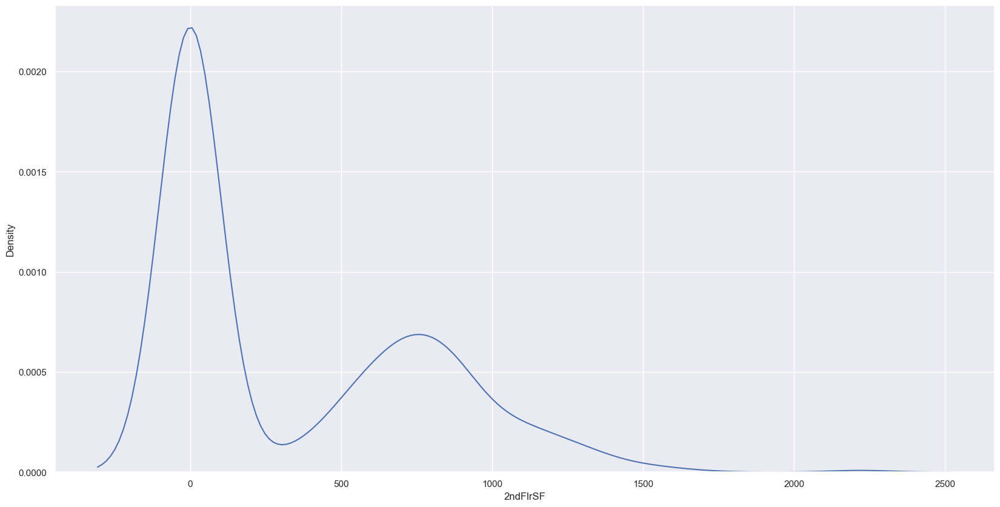

In [5098]:
sns.kdeplot(x='2ndFlrSF', data = HS)

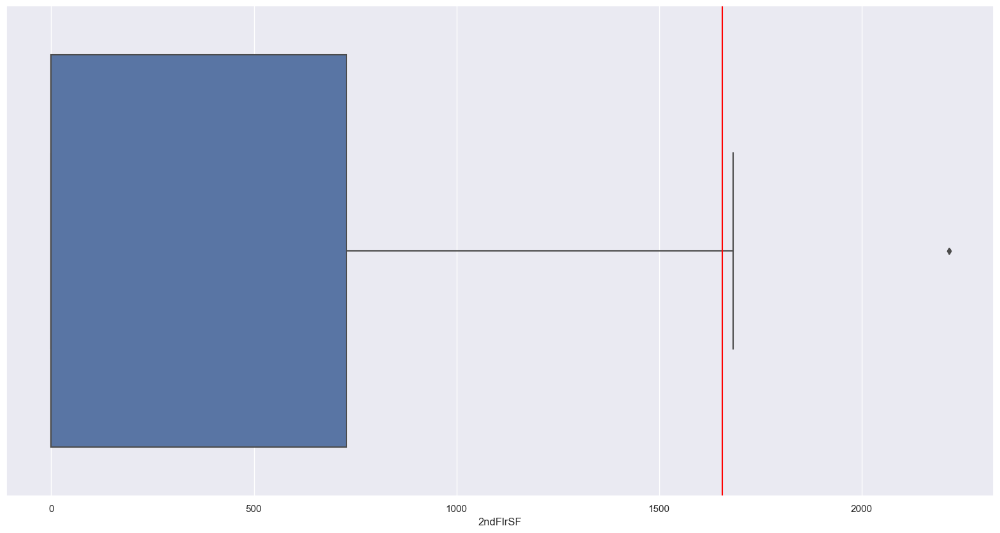

In [5099]:
x = sns.boxplot(x='2ndFlrSF', data = HS)
x = x.axvline(SndFlrSF_mean + 3* SndFlrSF_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

This variable overwhelmingly does not follow a normal distribution. It seems most houses in this dataset do not have second floors. This will make this variable tough to use I think. The mean being 346.36 and the median being 0 is quite a stark difference. Moreover, the std = 434.42. I am not confident that this variable will be helpful for me.

###### Bivariate Exploration:

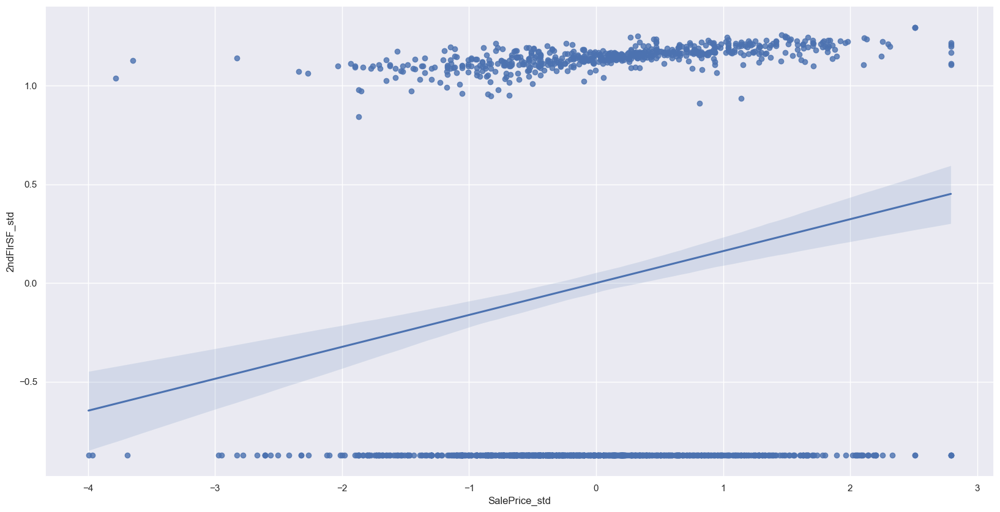

In [5100]:
sns.regplot(x= "SalePrice_std", y = "2ndFlrSF_std", data = HS)    
plt.show()    

In [5101]:
SndFlrSF_Corr = HS[['2ndFlrSF_std','SalePrice_std']]
SndFlrSF_Corr.corr()

,2ndFlrSF_std,SalePrice_std
2ndFlrSF_std,1.000000,0.161709
SalePrice_std,0.161709,1.000000


The correlation of 0.16 is low but more than I thought it might be considering. In the end, this will most likely not be a variable I include in my top 7.

#### All_House_Baths

I will combine the BsmtFullBath, BsmtHalfBath, FullBath, and HalfBath together in order to make it one column of bathrooms in the house. I will treat half baths as 0.5 and full baths as 1.0. I will then do analysis on my All_House__Baths variable as opposed to each one individually.

In [5102]:
HS["House_Full_Baths"] = HS.BsmtFullBath + HS.FullBath

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1456219511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["House_Full_Baths"] = HS.BsmtFullBath + HS.FullBath


In [5103]:
HS["House_Half_Baths"] = HS.BsmtHalfBath + HS.HalfBath

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/864572005.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["House_Half_Baths"] = HS.BsmtHalfBath + HS.HalfBath


In [5104]:
HS["House_Half_Baths"] = HS.House_Half_Baths/2

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2330289165.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["House_Half_Baths"] = HS.House_Half_Baths/2


In [5105]:
HS['All_House_Baths'] = HS.House_Half_Baths + HS.House_Full_Baths
HS

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2548415997.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['All_House_Baths'] = HS.House_Half_Baths + HS.House_Full_Baths


,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths
0,60,65.000000,8450,Reg,Inside,CollgCr,7,5,VinylSd,856.000000,854.000000,TA,548,208500.000000,1,0,2,1,11.844100,0.578222,20.476157,0.347489,7.347804,-0.810733,5.005268,1.164051,3,0.5,3.5
1,20,80.000000,9600,Reg,FR2,Veenker,6,8,MetalSd,1262.000000,0.000000,TA,460,181500.000000,0,1,2,0,11.714406,0.224997,23.556956,0.672613,7.808621,0.425189,-2.569273,-0.871894,2,0.5,2.5
2,60,68.000000,11250,IR1,Inside,CollgCr,7,5,VinylSd,920.000000,866.000000,TA,608,223500.000000,1,0,2,1,11.909032,0.755066,21.111730,0.414563,7.433065,-0.582061,5.012685,1.166045,3,0.5,3.5
3,70,60.000000,9550,IR1,Corner,Crawfor,7,5,Wd Sdng,961.000000,756.000000,TA,642,140000.000000,1,0,1,0,11.471353,-0.436960,19.392237,0.233101,7.484696,-0.443585,4.940066,1.146526,2,0.0,2.0
4,60,84.000000,14260,IR1,FR2,NoRidge,8,5,VinylSd,1145.000000,1053.000000,TA,836,250000.000000,1,0,2,1,12.013707,1.040149,24.341327,0.755389,7.692708,0.114307,5.115598,1.193707,3,0.5,3.5
5,50,85.000000,14115,IR1,Inside,Mitchel,5,5,VinylSd,796.000000,566.000000,TA,480,143000.000000,1,0,1,1,11.491216,-0.382863,24.535249,0.775854,7.262025,-1.040795,4.782229,1.104101,2,0.5,2.5
6,20,75.000000,10084,Reg,Inside,Somerst,8,5,VinylSd,1694.000000,0.000000,TA,636,307000.000000,1,0,2,0,12.205408,1.562250,22.555812,0.566960,8.161059,1.370434,-2.569273,-0.871894,3,0.0,3.0
7,60,0.000000,10382,IR1,Corner,NWAmes,7,6,HdBoard,1107.000000,983.000000,TA,484,200000.000000,1,0,2,1,11.805186,0.472241,-1.214784,-1.941601,7.652563,0.006637,5.079603,1.184032,3,0.5,3.5
8,50,51.000000,6120,Reg,Inside,OldTown,7,5,BrkFace,1022.000000,752.000000,Fa,468,129900.000000,0,0,2,0,11.401188,-0.628057,17.352912,0.017887,7.557668,-0.247874,4.937212,1.145759,2,0.0,2.0
9,190,50.000000,7420,Reg,Corner,BrkSide,5,6,MetalSd,1077.000000,0.000000,Gd,205,118000.000000,1,0,1,0,11.311111,-0.873381,17.118418,-0.006860,7.619908,-0.080944,-2.569273,-0.871894,2,0.0,2.0


###### Exploration:

We check for proportions and countplot for categorical variable exploration.

In [5106]:
print(HS['All_House_Baths'].value_counts())
HS['All_House_Baths'].value_counts(normalize = True).round(2)

All_House_Baths
2.0    456
2.5    295
1.0    228
3.0    186
3.5    144
1.5    129
4.0     13
4.5      7
6.0      1
5.0      1
Name: count, dtype: int64


All_House_Baths
2.0    0.31
2.5    0.20
1.0    0.16
3.0    0.13
3.5    0.10
1.5    0.09
4.0    0.01
4.5    0.00
6.0    0.00
5.0    0.00
Name: proportion, dtype: float64

<Axes: xlabel='All_House_Baths', ylabel='count'>

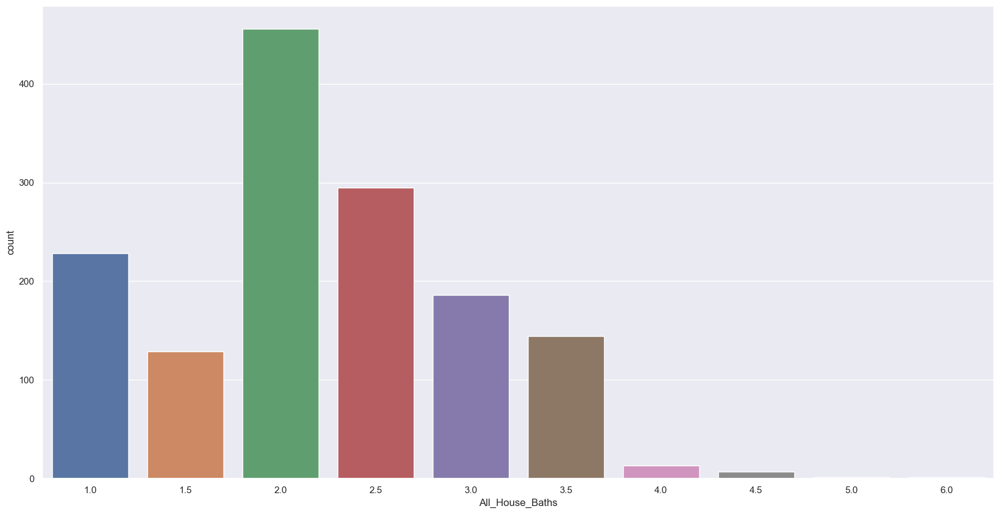

In [5107]:
sns.countplot(x='All_House_Baths', data = HS)

###### Cleaning:

1. As we can see the All_House_Bath values of 4.5, 5.0, and 6.0 are all underreprestend. Instead of putting these all into the 4.0, which they would logically be closest to, I will creat a new cateogry called 4 or more. Because the sum of the baths for the underrepresented values is only 9, I have to pull the 4 into it as well.

In [5108]:
HS.loc[HS.All_House_Baths == 4.0, 'All_House_Baths'] = '4 or more'
HS.loc[HS.All_House_Baths == 4.5, 'All_House_Baths'] = '4 or more'
HS.loc[HS.All_House_Baths == 5.0, 'All_House_Baths'] = '4 or more'
HS.loc[HS.All_House_Baths == 6.0, 'All_House_Baths'] = '4 or more'
HS['All_House_Baths'].value_counts()

All_House_Baths
2.0          456
2.5          295
1.0          228
3.0          186
3.5          144
1.5          129
4 or more     22
Name: count, dtype: int64

2. There are no null values and all the house bathroom values look usual to me.

In [5109]:
HS[HS.All_House_Baths.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths


###### Univariate Exploration:

1. Re-checking the proportions and countplot for All_House_Baths.

In [5110]:
print(HS['All_House_Baths'].value_counts())
HS['All_House_Baths'].value_counts(normalize = True).round(2)

All_House_Baths
2.0          456
2.5          295
1.0          228
3.0          186
3.5          144
1.5          129
4 or more     22
Name: count, dtype: int64


All_House_Baths
2.0          0.31
2.5          0.20
1.0          0.16
3.0          0.13
3.5          0.10
1.5          0.09
4 or more    0.02
Name: proportion, dtype: float64

<Axes: xlabel='All_House_Baths', ylabel='count'>

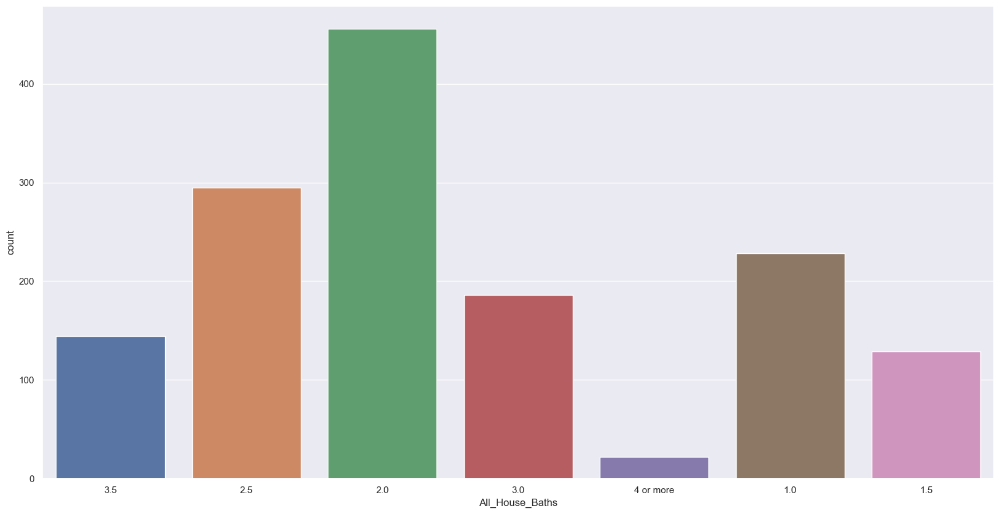

In [5111]:
sns.countplot(x='All_House_Baths', data = HS)

The most common quantity of Full and Half baths combined in one house is 2, making up about 31% of all houses in the dataset. It is quite uncommon for a house to have 4 or more full+half bathrooms, as only 2% of the dataframe is made up of those kinds of houses. I believe the 4 or more variable will have a positive correlation with SalePrice with the opposite being true for the 1.0 with a negative relationship. I will checl that now.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='All_House_Baths', ylabel='SalePrice'>

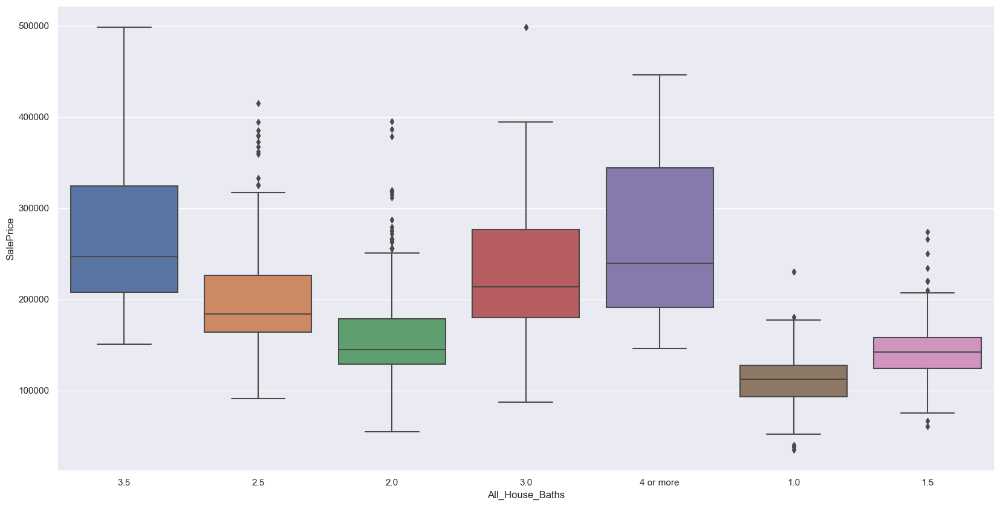

In [5112]:
sns.boxplot(x = 'All_House_Baths', y = 'SalePrice', data = HS)

In general we can see that as the quantity of baths increase, the median sales price increases more as well. This looks to have a somewhat linear relationship, similar to OverallQual which was analyzed before. The median for 4 or more looks to be around 250,000, while for 1.0 it looks to be around 125,000 or so. 

2. Finding the correlation between All_House_Baths and SalePrice.

In [5113]:
All_House_Baths_Corr = HS[['All_House_Baths','SalePrice_std']] # Creating new dataframe just with the two variables

In [5114]:
All_House_Baths_Corr.All_House_Baths = All_House_Baths_Corr.All_House_Baths.astype(str) # One hot encoding All_House_Baths

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2589908885.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  All_House_Baths_Corr.All_House_Baths = All_House_Baths_Corr.All_House_Baths.astype(str) # One hot encoding All_House_Baths


In [5115]:
All_House_Baths_Corr = pd.get_dummies(All_House_Baths_Corr)

3. Now I will create a heatmap to uncover the correlations for sale price and each All_House_Baths.

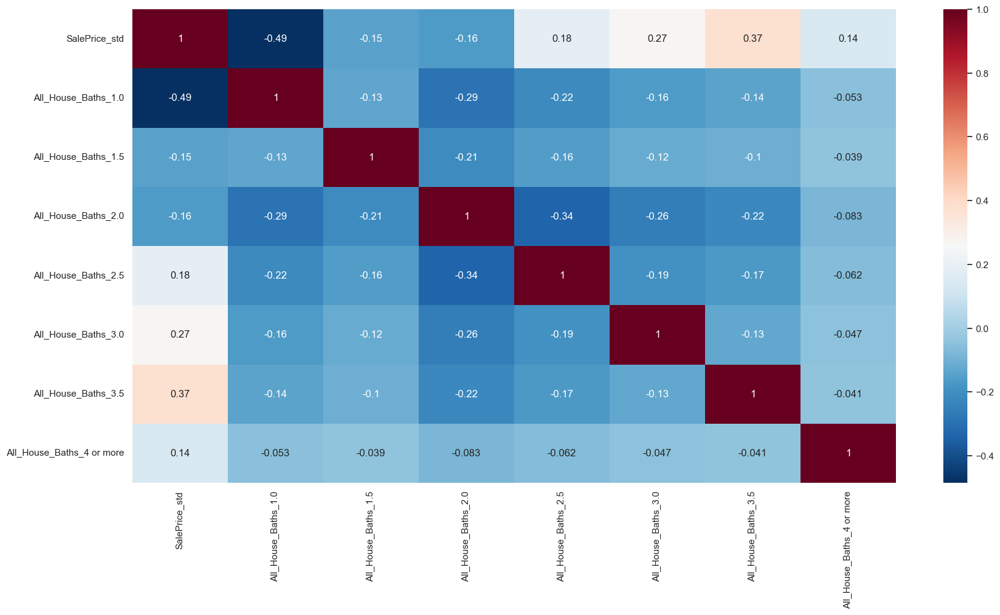

In [5116]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(All_House_Baths_Corr.corr(), annot = True, cmap="RdBu_r")
plt.show() 

All_House_Baths looks to be a good variable to highlight for this proejct. All_House_Baths of 2.5, 3.0, 3.5, and 4 or more had correlations of 0.18, 0.27, 0.37, and 0.14 respectively. These all signify a positive correlation between a higher number of All_House_Baths and higher salesPrices. On the other hand, All_House_Baths of 1.0, 1.5, and 2.0 had correlations of -0.49, -0.15, and -0.16, respectively, all signifying negative correlations between themselves and SalePrice. This makes sense, the more bathrooms in a house means likely the more valuable it is. I expect this to be one of my strongest variables.

#### GarageQual

###### Exploration:

1. We check for proportions and countplot for categorical variable exploration.

In [5117]:
print(HS['GarageQual'].value_counts())
HS['GarageQual'].value_counts(normalize = True).round(2)

GarageQual
TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: count, dtype: int64


GarageQual
TA    0.95
Fa    0.03
Gd    0.01
Ex    0.00
Po    0.00
Name: proportion, dtype: float64

<Axes: xlabel='GarageQual', ylabel='count'>

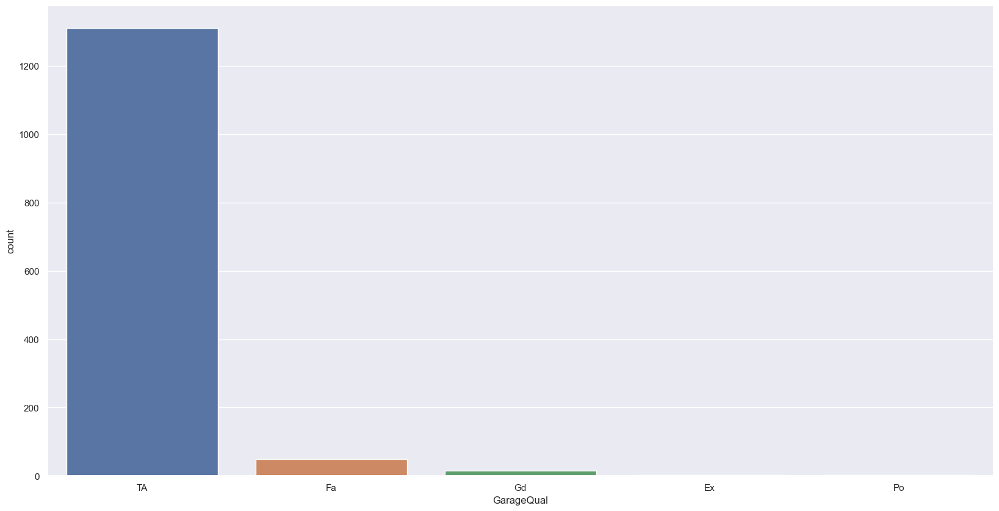

In [5118]:
sns.countplot(x='GarageQual', data = HS)

###### Cleaning:

1. As we can see Ex and Po are underrepresented values that need to be cleaned.

In [5119]:
print(House_Sales.groupby('GarageQual')[["SalePrice", "OverallQual"]].agg([np.mean, np.median]))

                SalePrice           OverallQual       
                     mean    median        mean median
GarageQual                                            
Ex          241000.000000  127500.0    7.000000    6.0
Fa          123573.354167  115000.0    5.166667    5.0
Gd          215860.714286  209115.0    6.714286    6.5
Po          100166.666667   96500.0    5.333333    5.0
TA          187489.836003  170000.0    6.218917    6.0


2. Ex and GD are the most similar by overallqual and SalePrice so I will replace the Ex GarageQual values with GD, and for Po I will put them into FA as it is the most similar to that one.

In [5120]:
HS.loc[HS.GarageQual == 'Ex', 'GarageQual'] = 'Gd'
HS.loc[HS.GarageQual == 'Po', 'GarageQual'] = 'Fa'
HS['GarageQual'].value_counts()

GarageQual
TA    1311
Fa      51
Gd      17
Name: count, dtype: int64

3. Now to replace any null values.

In [5121]:
HS[HS.GarageQual.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths
39,90,65.000000,6040,Reg,Inside,Edwards,4,5,AsbShng,1152.0,0.0,NaN,0,82000.0,0,0,2,0,10.969457,-1.803882,20.476157,0.347489,7.699961,0.133760,-2.569273,-0.871894,2,0.0,2.0
48,190,33.000000,4456,Reg,Inside,OldTown,4,5,MetalSd,736.0,716.0,NaN,0,113000.0,0,0,2,0,11.270505,-0.983975,12.817420,-0.460753,7.169692,-1.288433,4.910747,1.138645,2,0.0,2.0
78,90,72.000000,10778,Reg,Inside,Sawyer,4,5,HdBoard,1768.0,0.0,NaN,0,136500.0,0,0,2,0,11.447632,-0.501565,21.943292,0.502319,8.212458,1.508288,-2.569273,-0.871894,2,0.0,2.0
88,50,105.000000,8470,IR1,Corner,IDOTRR,3,3,Plywood,1013.0,0.0,NaN,0,85000.0,0,0,1,0,11.003217,-1.711936,28.253013,1.168197,7.547173,-0.276021,-2.569273,-0.871894,1,0.0,1.0
89,20,60.000000,8070,Reg,Inside,CollgCr,4,5,VinylSd,990.0,0.0,NaN,0,123600.0,1,0,1,0,11.354586,-0.754978,19.392237,0.233101,7.519934,-0.349076,-2.569273,-0.871894,2,0.0,2.0
99,20,77.000000,9320,IR1,Inside,NAmes,4,5,Plywood,1225.0,0.0,NaN,0,128950.0,1,0,1,1,11.394308,-0.646794,22.959139,0.609524,7.773140,0.330027,-2.569273,-0.871894,2,0.5,2.5
108,50,85.000000,8500,Reg,Corner,IDOTRR,5,7,CemntBd,997.0,520.0,NaN,0,115000.0,0,0,2,0,11.286960,-0.939158,24.535249,0.775854,7.528289,-0.326668,4.735192,1.091458,2,0.0,2.0
125,190,60.000000,6780,Reg,Inside,IDOTRR,6,8,Wd Sdng,520.0,0.0,NaN,0,84500.0,1,0,1,0,10.997675,-1.727032,19.392237,0.233101,6.762537,-2.380432,-2.569273,-0.871894,2,0.0,2.0
127,45,55.000000,4388,IR1,Inside,OldTown,5,7,WdShing,840.0,0.0,NaN,0,87000.0,0,0,1,0,11.025065,-1.652435,18.274423,0.115136,7.325517,-0.870507,-2.569273,-0.871894,1,0.0,1.0
140,20,70.000000,10500,Reg,FR2,NAmes,4,5,HdBoard,864.0,0.0,NaN,0,115000.0,0,0,1,0,11.286960,-0.939158,21.529704,0.458672,7.358795,-0.781254,-2.569273,-0.871894,1,0.0,1.0


4. We can see that when there are 81 cases of NaN values for GarageQual. For each of these NaNs for GarageQual the GarageArea corresponding is also 0, this means that there is no garage and because of that I will replace NaN values with 'No Garage'.

In [5122]:
HS['GarageQual'] = HS['GarageQual'].fillna('No Garage')

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1372852204.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['GarageQual'] = HS['GarageQual'].fillna('No Garage')


In [5123]:
HS[HS.GarageQual.isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths


In [5124]:
HS.iloc[39,:]

MSSubClass                  90
LotFrontage               65.0
LotArea                   6040
LotShape                   Reg
LotConfig               Inside
Neighborhood           Edwards
OverallQual                  4
OverallCond                  5
Exterior1st            AsbShng
1stFlrSF                1152.0
2ndFlrSF                   0.0
GarageQual           No Garage
GarageArea                   0
SalePrice              82000.0
BsmtFullBath                 0
BsmtHalfBath                 0
FullBath                     2
HalfBath                     0
SalePrice_Trans      10.969457
SalePrice_std        -1.803882
LotFrontage_Trans    20.476157
LotFrontage_std       0.347489
FstFlrSF_Trans        7.699961
1stFlrSF_std           0.13376
2ndFlrSF_Trans       -2.569273
2ndFlrSF_std         -0.871894
House_Full_Baths             2
House_Half_Baths           0.0
All_House_Baths            2.0
Name: 39, dtype: object

5. Now that we checked that the null values have been fixed and all underrepresented values are set we can move on.

###### Univariate Exploration:

1. Re-checking the proportions and countplot for GarageQual.

In [5125]:
print(HS['GarageQual'].value_counts())
HS['GarageQual'].value_counts(normalize = True).round(2)

GarageQual
TA           1311
No Garage      81
Fa             51
Gd             17
Name: count, dtype: int64


/Users/kaiallen/anaconda3/lib/python3.11/site-packages/IPython/core/displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


GarageQual
TA           0.90
No Garage    0.06
Fa           0.03
Gd           0.01
Name: proportion, dtype: float64

<Axes: xlabel='GarageQual', ylabel='count'>

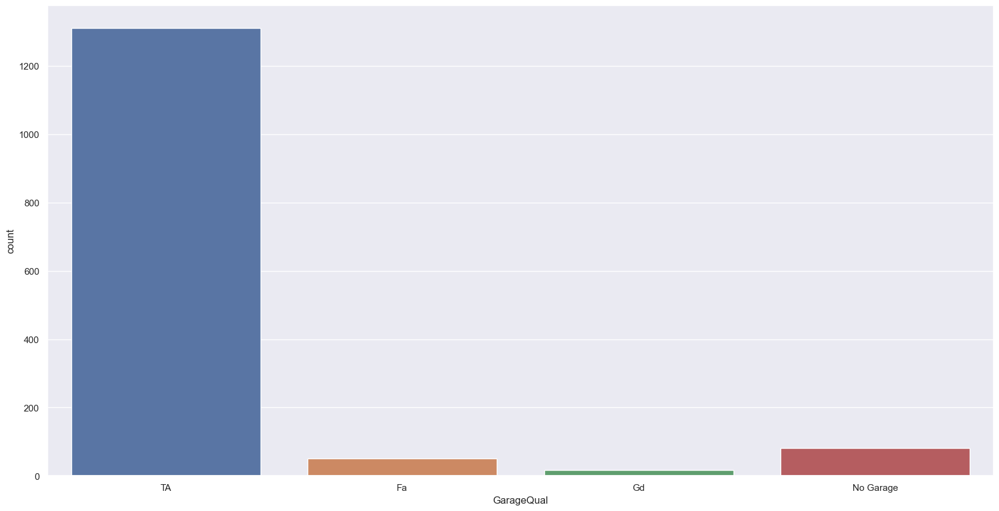

In [5126]:
sns.countplot(x='GarageQual', data = HS)

A vast majority of GarageQual falls into the category TA, which makes up 90% of the dataset. The next highest is No Garage, at ony 6% of the dataset. I am curious on how No Garage and SalePrice will potentially correlate in the bivariate exploration. This is the one variable that has the highest proportion for its mode at 90%, so again, bivariate analysis should be interesting.

###### Bivariate Exploration:

1. I will use a boxplot to begin bivariate analysis.

<Axes: xlabel='GarageQual', ylabel='SalePrice'>

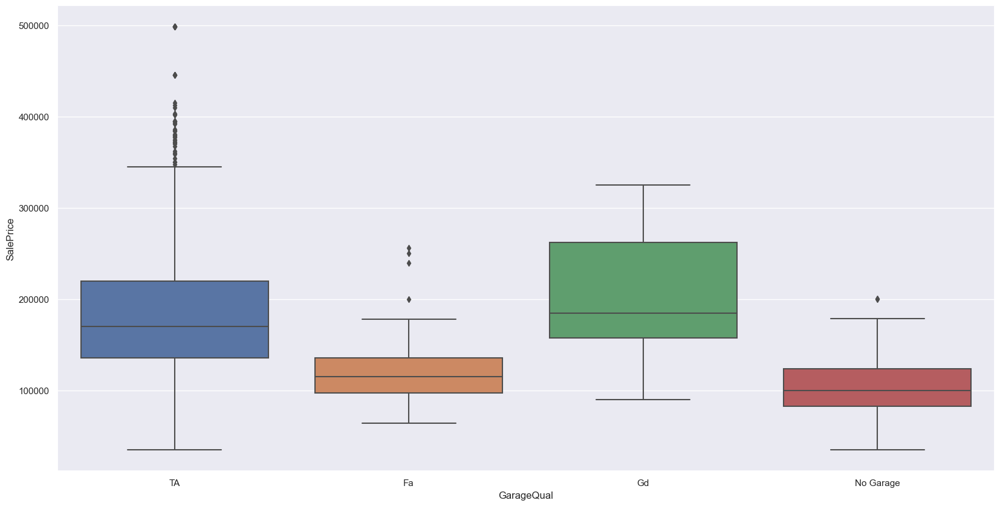

In [5127]:
sns.boxplot(x = 'GarageQual', y = 'SalePrice', data = HS)

It looks as if we might have a negative correlation between having No Garage and SalePrice. The median for No Gargae is quite a bit lower than the mode of TA, while FA also could have a negative correlation. The Gd classification might on the other hand have a positive correlation with a bit of a higher median. I will now test.

2. Finding the correlation between GarageQual and SalePrice.

In [5128]:
GarageQual_Corr = HS[['GarageQual','SalePrice_std']] # Creating new dataframe just with the two variables

In [5129]:
GarageQual_Corr.GarageQual = GarageQual_Corr.GarageQual.astype(str) # One hot encoding 

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/1693386795.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  GarageQual_Corr.GarageQual = GarageQual_Corr.GarageQual.astype(str) # One hot encoding


In [5130]:
GarageQual_Corr = pd.get_dummies(GarageQual_Corr)

3. Now I will create a heatmap to uncover the correlations for sale price and each GarageQual.

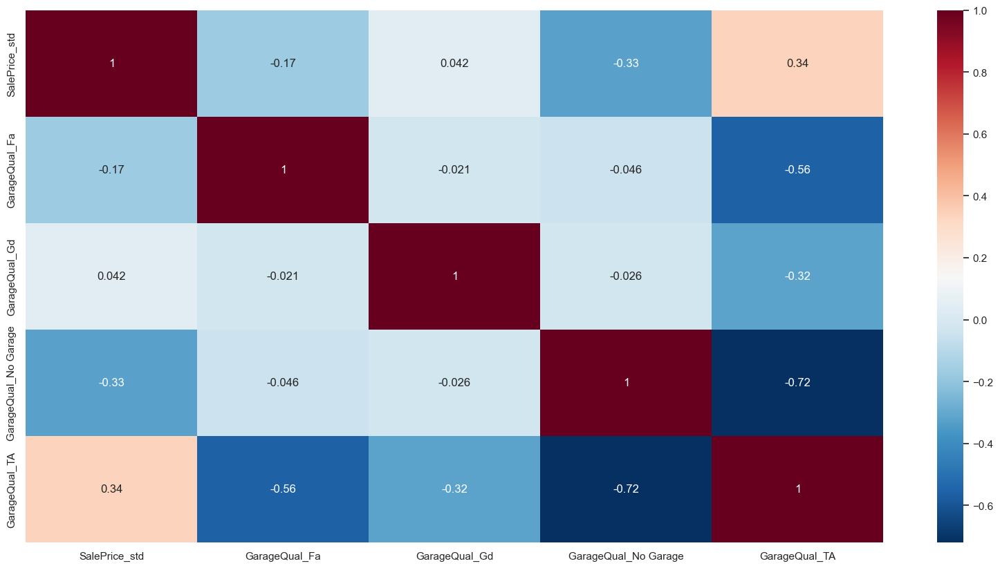

In [5131]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(GarageQual_Corr.corr(), annot = True, cmap="RdBu_r")
plt.show() 

GarageQual_TA, FA, and No Garage had correlations of 0.34, -0.17, and -0.33 respectively. As mentioned with the boxplot, I was thinking there might be a negative correlation between No Garage and FA based on their boxplots. This backed that up. Logically, it makes sense that No Garage might mean a lower SalePrice. TA is interesting as 0.34 is a fairly strong correlation. I have some good predictor variables for SalePrice. 

#### GarageArea

###### Exploration:

1. First I will check the descriptive statistics, the boxplot to show outliers, and kdeplot to show skewing as GarageArea is a numeric variable.

In [5132]:
HS.agg(
        {
            'GarageArea':['min','mean', 'median','max','std'],
        }).round(2)

,GarageArea
min,0.00
mean,472.98
median,480.00
max,1418.00
std,213.80


In [5133]:
GarageArea_mean = HS['GarageArea'].mean()
GarageArea_std = HS['GarageArea'].std()

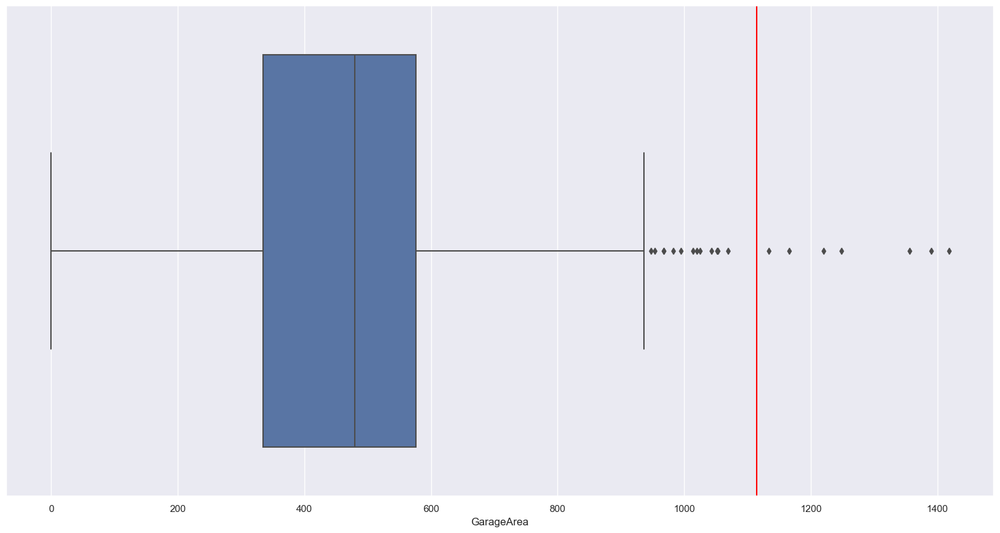

In [5134]:
x = sns.boxplot(x='GarageArea', data = HS)
x = x.axvline(GarageArea_mean + 3* GarageArea_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

<Axes: xlabel='GarageArea', ylabel='Density'>

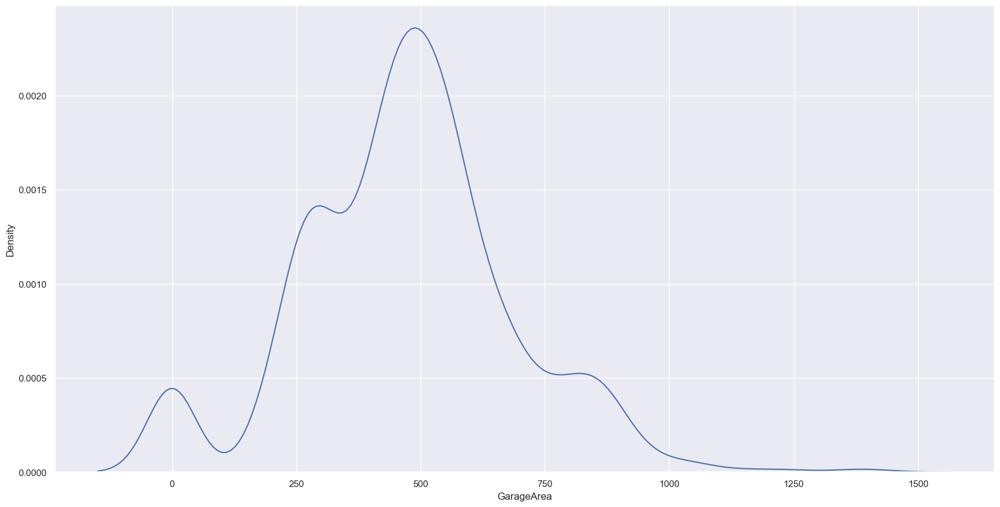

In [5135]:
sns.kdeplot(x='GarageArea', data = HS)

###### Cleaning:

1. As we can tell from the Boxplot there are some outliers that need to be cleaned. I will clean using the median GarageArea based on the neighborhood the garage is in, as I am sure the sizes vary based on what area they are in. I will replace by each neighborhoods mean value + 3 standard deviations

In [5136]:
HS.groupby("Neighborhood")["GarageArea"].agg(['mean', 'median','std']).round(0)

,mean,median,std
Neighborhood,,,
Blmngtn,503.0,438.0,115.0
BrDale,284.0,264.0,102.0
BrkSide,303.0,280.0,193.0
ClearCr,468.0,476.0,147.0
CollgCr,553.0,546.0,162.0
Crawfor,410.0,380.0,203.0
Edwards,326.0,318.0,236.0
Gilbert,453.0,427.0,89.0
IDOTRR,316.0,288.0,261.0


In [5137]:
(HS[HS['GarageArea'] > GarageArea_mean + 3* GarageArea_std])

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths
178,20,63.000000,17423,IR1,CulDSac,StoneBr,9,5,VinylSd,2234.000000,0.0,TA,1166,297928.580713,1,0,2,0,12.177426,1.486041,20.046416,0.302138,8.494658,2.265153,-2.569273,-0.871894,3,0.0,3.0
581,20,98.000000,12704,Reg,Inside,NridgHt,8,5,VinylSd,2042.000000,0.0,TA,1390,253293.000000,0,0,2,1,12.025927,1.073432,26.984269,1.034304,8.386065,1.973905,-2.569273,-0.871894,2,0.5,2.5
664,20,49.000000,20896,IR2,CulDSac,Somerst,8,5,VinylSd,2097.000000,0.0,TA,1134,379604.690189,1,0,1,1,12.403318,2.101261,16.882187,-0.031790,8.418157,2.059977,-2.569273,-0.871894,2,0.5,2.5
825,20,114.000000,14803,Reg,Inside,NridgHt,10,5,CemntBd,2084.000000,0.0,TA,1220,385000.000000,1,0,2,0,12.416467,2.137073,29.839259,1.335597,8.410647,2.039833,-2.569273,-0.871894,3,0.0,3.0
1061,30,120.000000,18000,Reg,Inside,IDOTRR,3,4,MetalSd,894.000000,0.0,TA,1248,81000.000000,0,0,1,0,10.957928,-1.835283,30.871108,1.444491,7.399148,-0.673029,-2.569273,-0.871894,1,0.0,1.0
1190,190,0.000000,32463,Reg,Inside,Mitchel,4,4,MetalSd,1622.000000,0.0,TA,1356,168000.000000,1,0,1,0,11.642081,0.028019,-1.214784,-1.941601,8.108902,1.230547,-2.569273,-0.871894,2,0.0,2.0
1298,60,124.805362,63887,IR3,Corner,Edwards,10,5,Stucco,1905.131804,950.0,TA,1418,160000.000000,2,0,2,1,11.596410,-0.096366,31.683829,1.530259,8.302392,1.749492,5.061649,1.179206,4,0.5,4 or more


###### Cleaning with each outliers grouped mean based on what neighborhood the house is in:

1. StoneBr:

In [5138]:
StoneBr_GarageArea_mean = HS[(HS.Neighborhood == "StoneBr") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
StoneBr_GarageArea_mean

609.25

In [5139]:
StoneBr_GarageArea_std = HS[(HS.Neighborhood == "StoneBr") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
StoneBr_GarageArea_std

123.11368023444659

In [5140]:
Replacement_StoneBr = StoneBr_GarageArea_mean + 3 * StoneBr_GarageArea_std

In [5141]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "StoneBr"), "GarageArea"] = Replacement_StoneBr 

2. NridgHt: 

In [5142]:
NridgHt_GarageArea_mean = HS[(HS.Neighborhood == "NridgHt") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
NridgHt_GarageArea_mean

730.84

In [5143]:
NridgHt_GarageArea_std = HS[(HS.Neighborhood == "NridgHt") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
NridgHt_GarageArea_std

157.00404883744673

In [5144]:
Replacement_NridgHt = NridgHt_GarageArea_mean + 3 * NridgHt_GarageArea_std

In [5145]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "NridgHt"),'GarageArea'] = Replacement_NridgHt 

3. Somerst:

In [5146]:
Somerst_GarageArea_mean = HS[(HS.Neighborhood == "Somerst") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
Somerst_GarageArea_mean

624.7058823529412

In [5147]:
Somerst_GarageArea_std = HS[(HS.Neighborhood == "Somerst") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
Somerst_GarageArea_std

161.38174378439078

In [5148]:
Replacement_Somerst = Somerst_GarageArea_mean + 3 * Somerst_GarageArea_std

In [5149]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "Somerst"), "GarageArea"] = Replacement_Somerst 

4. IDOTRR:

In [5150]:
IDOTRR_GarageArea_mean = HS[(HS.Neighborhood == "IDOTRR") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
IDOTRR_GarageArea_mean

290.1111111111111

In [5151]:
IDOTRR_GarageArea_std = HS[(HS.Neighborhood == "IDOTRR") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
IDOTRR_GarageArea_std

211.3647866033342

In [5152]:
Replacement_IDOTRR = IDOTRR_GarageArea_mean + 3 * IDOTRR_GarageArea_std

In [5153]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "IDOTRR"), "GarageArea"] = Replacement_IDOTRR 

5. Mitchel: 

In [5154]:
Mitchel_GarageArea_mean = HS[(HS.Neighborhood == "Mitchel") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
Mitchel_GarageArea_mean

463.7916666666667

In [5155]:
Mitchel_GarageArea_std = HS[(HS.Neighborhood == "Mitchel") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
Mitchel_GarageArea_std

218.4357306846028

In [5156]:
Replacement_Mitchel = Mitchel_GarageArea_mean + 3 * Mitchel_GarageArea_std
Replacement_Mitchel

1119.0988587204752

In [5157]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "Mitchel"), "GarageArea"] = Replacement_Mitchel

6. Edwards:

In [5158]:
Edwards_GarageArea_mean = HS[(HS.Neighborhood == "Edwards") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].mean()
Edwards_GarageArea_mean

315.17171717171715

In [5159]:
Edwards_GarageArea_mean = HS[(HS.Neighborhood == "Edwards") &
                               (HS.GarageArea < GarageArea_mean + 3* GarageArea_std)]["GarageArea"].std()
Edwards_GarageArea_mean

209.259581030699

In [5160]:
Replacement_Edwards = Edwards_GarageArea_mean + 3 * Edwards_GarageArea_std
Replacement_Edwards

837.038324122796

In [5161]:
HS.loc[(HS.GarageArea > GarageArea_mean + 3* GarageArea_std) & 
       (HS.Neighborhood == "Edwards"), "GarageArea"] = Replacement_Edwards

2. The outliers have now been removed. Now, I will check for null values.

In [5162]:
HS[HS['GarageArea'].isnull()]

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths


3. There are no null values, outliers have been cleaned, and all values look like they make sense to me. Now I will use boxcox to better have GarageArea follow a normal distribution. Because there are 0 values I will add the small value of 0.1 so that boxcox can work.

In [5163]:
GarageArea_transformed, best_lambda = boxcox(HS['GarageArea'] + 0.1) 
HS['GarageArea_trans'] = GarageArea_transformed

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/2167642917.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS['GarageArea_trans'] = GarageArea_transformed


4. Now that the data is cleaned and bests follows a normal distribution, I will save the standard deviation values (z-scores) for each individual value to help me in the future.

In [5164]:
scaler = StandardScaler()
HS["GarageArea_std"] = scaler.fit_transform(HS[['GarageArea_trans']])
HS[["GarageArea_std", 'GarageArea_trans',"GarageArea"]].head(10)

/var/folders/2n/1sl69vv56s18gtxtgwmgrrfr0000gn/T/ipykernel_8041/3784545495.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HS["GarageArea_std"] = scaler.fit_transform(HS[['GarageArea_trans']])


,GarageArea_std,GarageArea_trans,GarageArea
0,0.400199,151.002696,548.0
1,0.019237,132.223970,460.0
2,0.651197,163.375109,608.0
3,0.790682,170.250697,642.0
4,1.554795,207.915985,836.0
5,0.107301,136.564890,480.0
6,0.766203,169.044057,636.0
7,0.124803,137.427638,484.0
8,0.054574,133.965850,468.0
9,-1.214100,71.429295,205.0


###### Univariate Exploration:

1. I will begin by re-checking the descriptive statistics, KDE, and boxplot.

In [5165]:
HS.agg(
        {
            'GarageArea':['min','mean', 'median','max','std'],
        }).round(2)

,GarageArea
min,0.00
mean,471.91
median,480.00
max,1201.85
std,210.39


<Axes: xlabel='GarageArea', ylabel='Density'>

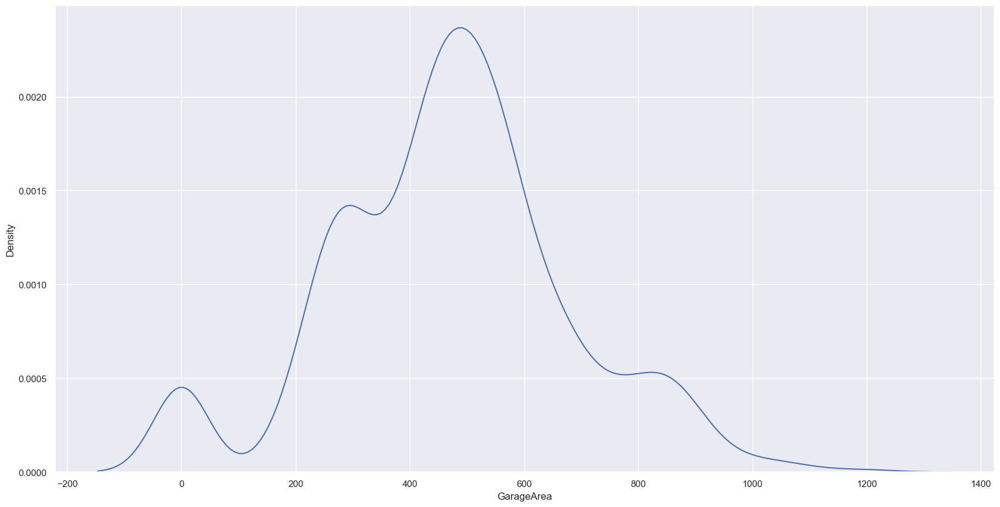

In [5166]:
sns.kdeplot(x='GarageArea', data = HS)

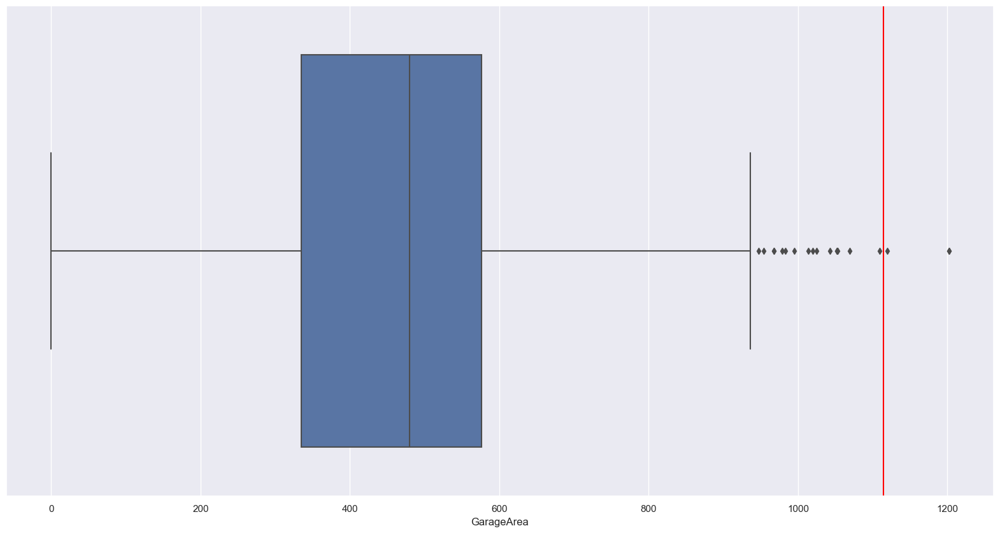

In [5167]:
x = sns.boxplot(x='GarageArea', data = HS)
x = x.axvline(GarageArea_mean + 3* GarageArea_std, ymin = 0, ymax = 1, color = 'red')
plt.show()

The data more closely follows a normal distribution now, as shown with the kde plot. There obviously is a significant cluster of values at the 0 mark in the kde, which makes sense as all houses without garages will hold this value. Regardless, it is now approaching a normal distribution. This is backed up with the mean being 471.67 and the median being 480.00, which shows minimal skewing. As shown in the boxplot, all outliers have now been cleaned as well. There seems to be some fairly large garages still and I am curious how they might correlate to SalePrice.

###### Bivariate Exploration:

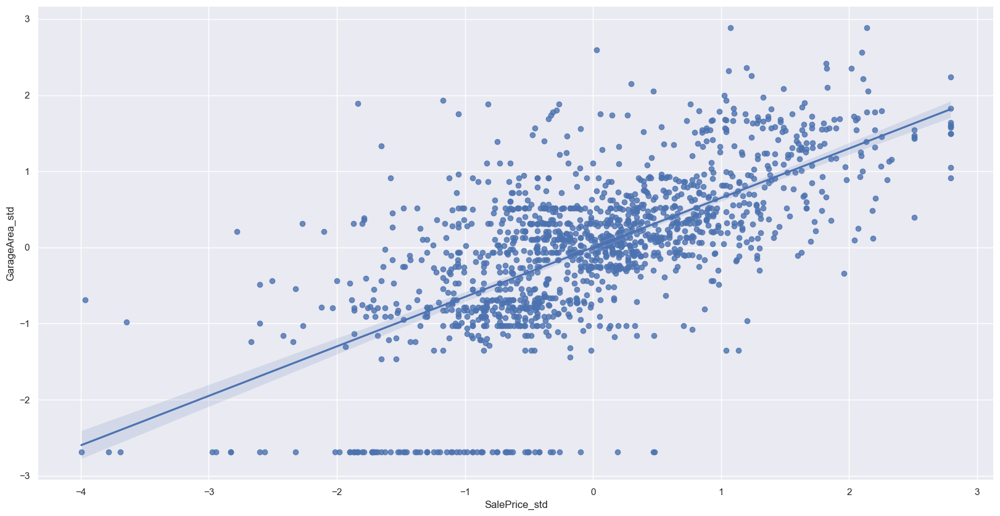

In [5168]:
sns.regplot(x= "SalePrice_std", y = "GarageArea_std", data = HS)    
plt.show()    

In [5178]:
GarageArea_Corr = HS[['GarageArea_std','SalePrice_std']]

In [5179]:
GarageArea_Corr.corr()

,GarageArea_std,SalePrice_std
GarageArea_std,1.000000,0.650103
SalePrice_std,0.650103,1.000000


Overall, this shows a strong positive correlation between GarageArea and SalePrice. This can be visualized with the Regression Plot, and articulated by the ~ 0.650 correlation between the two. This is the strongest variables analyzed as far as correlation. It is also one that I spent the most time cleaning, which might have played a part as well. Again, logically, this makes sense: The bigger the garage, the higher the houses SalePrice. The garage has to be big enough to fit all their cars!

### Heatmap of all the Numeric Variables:

In [5171]:
Numeric_Var_Corr = HS[['SalePrice_std','LotFrontage_std','1stFlrSF_std','2ndFlrSF_std','GarageArea_std']]

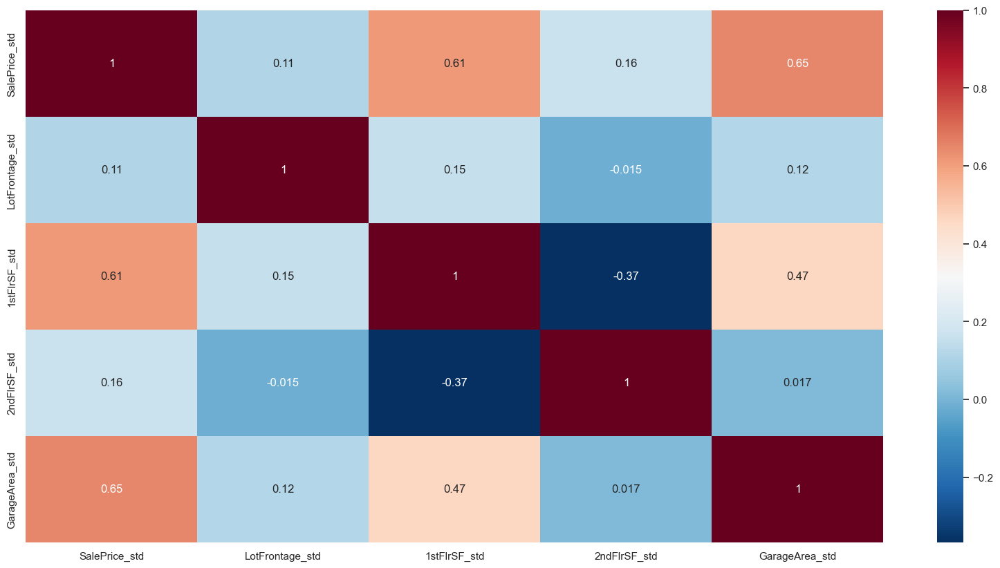

In [5172]:
sns.set_theme(rc={'figure.figsize':(20,10)})
sns.heatmap(Numeric_Var_Corr.corr(), annot = True, cmap="RdBu_r")
plt.show() 

# Conclusion:

All of these correlations are strong and good indicators of SalePrice. There are more that I debated on including, for example, Exterior1st had correlations of -0.17, -0.17, 0.34, and -0.19... all correlations that are worth noting. As well as LotShape, which had correlations of 0.25, 0.11, and -0.29. Nevertheless, the variables I chose I believe have the strongest correlations to SalePrice as indicated above. 

GarageArea with a positive correlation of 0.65 beat all other variables out. As aforementioned, the more cars you have, the more GarageArea you need. Someone who has a lot of cars likely has a lot of money, and likely means that they will buy more expensive home. 

Similar reasoning for the 1stFlrSF, the bigger the house, the more expensive in general. 

OverallQual was an interesting one as it seemed to have a fairly linear relationship. Each bump in OverallQual meant a bump in median SalePrice (in general). This makes sense: the better the condition of the home, the higher its value. 

All_House_Baths is quite straight forward. The fewer the bathrooms, the lower the price, more bathrooms, mean higher price. Of course people would prefer to have more bathrooms. No one likes sharing only one bathroom with 4 or 5 of their family members (hence the -0.49 correlation for All_House_Baths_1.0). This is one I assumed would have solid correlations and it definitely did.

GarageQual is another interesting one. It seems a house without a garage likely means lower SalePrice. This makes sense as most people I assume would prefer to have a garage for their homes, especially with the dataset coming from Iowa where the winters get dicey. This could be a reason why the value of homes without a garage generally sell for less. 

For MSSubClass, which uses numeric integer codes to represent the type of building the house is, there are a lot of strong correlations. This also makes sense, a house's building type surely has an impact on how much it costs. 

Finally, for neighborhood, this is a variable that I expected to maybe see even some stronger correlations. Neighborhoods that are safe, have good school districts, close access to hospitals or grocery stores, etc, are all reasons why some neighborhoods are more expensive than others. 

Overall, I got a lot better at cleaning variables, doing analysis on them, and generally understanding topics discussed in class this year. I actually quite enjoyed the opportunity to explore an entire DataSet, regardless of its size, and apply things that we have been learning this semester.

In [5175]:
HS.head()

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,OverallQual,OverallCond,Exterior1st,1stFlrSF,2ndFlrSF,GarageQual,GarageArea,SalePrice,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice_Trans,SalePrice_std,LotFrontage_Trans,LotFrontage_std,FstFlrSF_Trans,1stFlrSF_std,2ndFlrSF_Trans,2ndFlrSF_std,House_Full_Baths,House_Half_Baths,All_House_Baths,GarageArea_trans,GarageArea_std
0,60,65.0,8450,Reg,Inside,CollgCr,7,5,VinylSd,856.0,854.0,TA,548.0,208500.0,1,0,2,1,11.844100,0.578222,20.476157,0.347489,7.347804,-0.810733,5.005268,1.164051,3,0.5,3.5,151.002696,0.400199
1,20,80.0,9600,Reg,FR2,Veenker,6,8,MetalSd,1262.0,0.0,TA,460.0,181500.0,0,1,2,0,11.714406,0.224997,23.556956,0.672613,7.808621,0.425189,-2.569273,-0.871894,2,0.5,2.5,132.223970,0.019237
2,60,68.0,11250,IR1,Inside,CollgCr,7,5,VinylSd,920.0,866.0,TA,608.0,223500.0,1,0,2,1,11.909032,0.755066,21.111730,0.414563,7.433065,-0.582061,5.012685,1.166045,3,0.5,3.5,163.375109,0.651197
3,70,60.0,9550,IR1,Corner,Crawfor,7,5,Wd Sdng,961.0,756.0,TA,642.0,140000.0,1,0,1,0,11.471353,-0.436960,19.392237,0.233101,7.484696,-0.443585,4.940066,1.146526,2,0.0,2.0,170.250697,0.790682
4,60,84.0,14260,IR1,FR2,NoRidge,8,5,VinylSd,1145.0,1053.0,TA,836.0,250000.0,1,0,2,1,12.013707,1.040149,24.341327,0.755389,7.692708,0.114307,5.115598,1.193707,3,0.5,3.5,207.915985,1.554795
